# Lab Two
### Modeling and Evaluation
#### Ricco Ferraro, David Grijalva, Nicole Norelli, & Mingyang Nick YU

__NBViewer Link:__ <a href="">Rendered Lab2</a>

The data used in this analysis is from LendingClub, a peer-to-peer lending company. (Data from Kaggle.)  
Our goal is to accurately predict loan outcomes and loan grade. These are both classification tasks.  

Loan Outcome: Correctly predicting if a borrower will default on a loan is valuable information for investors as well as the LendingClub company itself. Loan outcome predictions allow investors to make better, more informed decisions when deciding to fund a loan. There is value in making this prediction prospectively before a lender grants a loan or alternately midway through the life of an existing loan. Loan outcome is a variable we created indicating whether the loan is good ("fully paid", "current", "in grace period", and "issued") or bad ("charged off", "late", and "default"). The following analysis uses information from the data set about the borrower, loan terms, and loan outcomes to build three models to predict loan outcome. The first model was built using random forest, the second with decision tree, and the third with logistic regression.  

Loan Grade: Grade is assigned to the loan by LendingClub. The factors that determine the grade are not disclosed to the public, but the grade determines the interest rate assigned to a particular loan. The ability to predict grade could be useful to both competitors and loan applicants. Competitors could be interested in the strategy LendingClub uses to grade loans, and loan applicants could be interested in determining the optimal way to improve their own loan grade and therefore obtain a lower interest rate. The following analysis uses information from the data set about the borrower, loan terms, and loan outcomes to build three models to predict loan grade. The first model was built using random forest, the second with decision tree, and the third with logistic regression.  


https://www.kaggle.com/ethon0426/lending-club-20072020q1

https://www.lendingclub.com 

In [1]:
# Other imports
import pandas as pd
import numpy as np
import datetime
import warnings
warnings.filterwarnings("ignore")
import pickle
import joblib
from scipy import interp
from itertools import cycle


# sklearn imports
from sklearn.preprocessing import OneHotEncoder, StandardScaler, label_binarize, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_validate, StratifiedKFold, train_test_split,RandomizedSearchCV,GridSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,plot_confusion_matrix,plot_roc_curve,auc,roc_curve,confusion_matrix,accuracy_score
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# vizualization 
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from IPython.core.display import display, HTML
import plotly.express as px
from matplotlib import pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

# Model A/B test
import scipy
from mlxtend.evaluate import paired_ttest_5x2cv
from scipy.stats import ttest_rel

# import XGB
import xgboost as xgb


# Notebook options
pd.options.display.max_rows = 99999
pd.options.display.max_columns = 99999
# Usint fixed os structure
import os
cwd = os.getcwd()
d = os.path.dirname(cwd)

# Data Preparation Part 1

In [2]:
# set
path = f"{d}/data/loan_100k_sample_0618.pkl"
%time data = pd.read_pickle(path).reset_index()
data.drop('index',axis=1,inplace=True)

CPU times: user 69.8 ms, sys: 40.2 ms, total: 110 ms
Wall time: 109 ms


We explored and cleaned our data set during Project 1. We began this analysis with 100,000 instances and 55 variables. 

### Create New Variables

Although we will address our new features again in Data Preparation Part 2, we need to create them before moving forward, as one new feature will be a response variable we are predicting.  

__New Variables:__  
First we created a variable called `days_with_credit`. This calculates the number of days between an individual's earliest credit line and the issue date of the loan. The two variables that we used to calculate `days_with_credit` are not very useful to us in their original format, but we theorize that the length of a person's credit history could be useful in determining the outcome of their loan.

Next we created two new FICO score variables. There were six different FICO-related variables in the original data set, so we wanted to simplify them. First was `overall_fico`. This averaged the high and low original FICO score of the applicant.  When there was a secondary applicant on a loan, it averaged the secondary high and low score, and took the average between the primary and secondary applicant.  Next was `last_fico`. This averaged the most recent high and low FICO score (the difference between them was four, so we just subtracted 2) and imputed the original FICO value if there was no record of a more recent score.

Finally we created a `good_loan_or_not` variable. The original data set had eight different loan statuses. Our main goal was to predict if a loan was a good investment.  We grouped "charged off", "late", and "default" individuals together in a bad status, and grouped "fully paid", "current", "in grace period", and "issued" into a good loan status. This new variable will be the response we predict in our first set of models.  

__Change Data Type:__  
We converted string values to float values for the attributes `interest_rate` and `revolving line utilization rate` so they will be usable and the correct data type moving forward.

In [3]:
def str_to_rate(x: str):
    if isinstance(x, str):
        x = x[:-1]
        return float(x)
    elif np.isnan(x):
        return x
    else:
        pass
    
def remove_pattern(pattern: str, original: str):
    if isinstance(original, str):
        original = original.lower()
        return int(re.sub(pattern, '', original ))
    else:
        return np.nan
        
def str_date(x: str):
    if isinstance(x, str):
        x = datetime.datetime.strptime(x, '%b-%Y')
    else:
        x= np.nan
    return x

def credit_days(date2: datetime.date, date1: datetime.datetime.date):
    if isinstance(date2, datetime.date) and isinstance(date1, datetime.date):
        difference = date2 - date1
        return int(difference.days)
    else:
        return np.nan

def build_hist(data: pd.DataFrame, x: str):
    fig = px.histogram(data, x=x)
    fig.show()
    
def hist_by_group(data: pd.DataFrame,x: str, grp: str):
    fig = px.histogram(data, x=x,
        color = grp)
    fig.show()

In [4]:
def create_variables_data(data):
    #  Drop nan from earliest_cr_line  to ensure the credit_days function runs properly
    #crates new feature called days_with_credit from issue_d and earliest_cr_line
    data = data.dropna(subset=["earliest_cr_line"], axis=0)
    data['days_with_credit'] = data[['issue_d','earliest_cr_line']].apply(lambda x: credit_days(*x), axis=1)
    # Overall intial FICO score called 'overall_fico' that includes a secondary applicants score were applicable
    # Most recent FICO score called 'last_fico' that uses initial FICO score if there was no "last" value
    data['fico'] = (data['fico_range_high']+data['fico_range_low'])/2
    data['last_fico'] = data['last_fico_range_high']-2
    data['last_fico'] = np.where(data['last_fico']<=0,data['fico'],data['last_fico'])
    data['sec_app_fico'] = (data['sec_app_fico_range_high']+data['sec_app_fico_range_low'])/2
    data['overall_fico'] = data[['fico', 'sec_app_fico']].mean(axis=1)
    fico_to_drop = ['fico','fico_range_high','fico_range_low',
                    'last_fico_range_high','last_fico_range_low',
                    'sec_app_fico_range_high','sec_app_fico_range_low','sec_app_fico']
    data.drop(fico_to_drop,axis=1,inplace=True)
    # Creating good_loan_or_not column - consolidating loan_status column
    good_loan_status = ['Fully Paid','Current','In Grace Period','Issued']
    bad_loan_status = ['Charged Off','Late (31-120 days)','Late (16-30 days)','Default']
    #'Fully Paid' in good_loan_status
    def loan_flag(loan_st: str):
        if loan_st in good_loan_status:
            x = 1
            return x
        else:
            x = 0
            return x
    # create good_loan_or_not column 
    data["good_loan_or_not"] = data["loan_status"].apply(lambda x: loan_flag(x))
    # convert int rate string to float
    data["int_rate"] = data["int_rate"].apply(lambda x: str_to_rate(x) )
    # convert revol_util string to float
    data["revol_util"] = data["revol_util"].apply(lambda x: str_to_rate(x) )
    return data
    
data = create_variables_data(data)

### Further Data Cleaning: Remove Variables
We removed the following additional variables because they were not needed or not useful for our analysis.  

__Occur after loan is complete:__  

`debt_settlement_flag`, `recoveries`, `total_rec_late_fee`, `delinq_amnt`: Further exploratory data analysis for this project illustrated that these four variables are nearly perfect predictors for bad loan. They each occurred only when a loan is already late or charged off. We decided these would not be practical from a prediction standpoint. Our goal was to predict a bad outcome before it happens, and these only occur afterwards.  

`out_prncp`, `total_rec_princp`: These two variables, in combination with `total_loan_amnt`, almost perfectly predicted loan outcome. When `total_rec_princp` was equal to the total loan, the loan had been fully paid. When `total_rec_princp` plus `out_prncp` was equal to the total loan, it was current. However, when the combination of the two did not equal the total loan, the loan was charged off (bad status). This was because `out_prncp` was set to zero once the charge off occurred. This information was not useful from a prediction standpoint because it would only be available after a loan was fully paid or a charge off occurred.

__Not needed or useful:__  

`issue_d`, `earliest_cr_line`, `last_pymnt_d`: These variables are dates and are not useful in their current format for this analysis.  

`int_rate`: `grade` determines `int_rate` so we removed it and retained `grade`, as it is one of our outcome variables

`addr_state`: Our exploratory data analysis indicated that the home state of the loan applicant did not have a strong relationship with loan outcome or grade. We decided the additional 50 levels it would have added to the model were not necessary for a variable with little relationship to either outcome.  

Additionally, we removed one instance because it was the only instance of `home_ownership` with a value of "none."

`loan_status`: This variable was used to build our response variable (`good_loan_or_not`) so it was necessary to remove it from the explanatory variables.  

We removed `good_loan_or_not` from our loan outcome explanatory variables because it is the response we are predicting. We also removed it from our grade explanatory variables because of course it is not available until after the loan is complete.  

__Additional variables removed only for Grade prediction:__  
(These variables are present for models predicting loan outcome but not for models predicting grade.)

`hardship_flag`, `last_fico`, `last_pymnt_amnt`: These variables occur during the course of the loan. We restricted our explanatory variables when predicting grade to those that would be available only at the start of the loan, as we felt grade predictions would be most useful at the start of a loan.

`grade`: We removed `grade` from our explanatory variables for grade prediction because it is the response variable.



Text(0.5, 1.0, 'Class Frequencies')

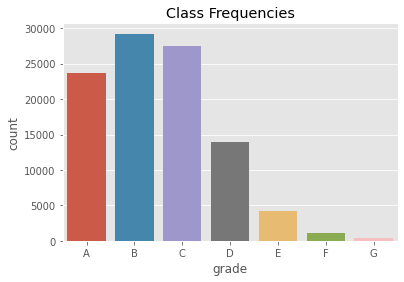

In [5]:
# Visual to illustrate multiclass imbalance
sns.countplot(data.grade, order=['A','B','C','D','E','F','G'])
plt.title('Class Frequencies')

### Modify Response Variable: Grade

We chose to predict `grade` in our second set of models.  The `grade` variable originally contained seven responses (A through G). As you can see from the graph above, these responses were highly imbalanced. After further data exploration and research, we decided to consolidate grades E through G. According to LendingClub, `grade` determines the interest rate a borrower is charged. Loans graded D have a minimum interest rate of 22.62%. Loans graded E, F, and G have minimum interest rates of 28.90%, 29.35%, and 30.79% respectively. We decided to group E through G together, as the interest rates are all quite similar.  

### Initial train/test 80/20 data split for later model selection
We conducted an 80/20 train/test stratified split. We chose a stratified split because both of our response variables have imbalanced classes, and we need our training and test data to reflect this. We will use cross-validation on the training set to tune hyperparameters and fit models, and then use the test set to compare the results of our chosen models. This allows us to use the same splits for all models we construct to predict a particular response variable, making comparisons among them more meaningful.

#### Define Helper Functions: prepare dataset for each response

In [6]:
def drop_variables(data, drop_vars):
    # Drop variables that perfectly colinears with good_loan_or_not
    
    temp_data = data.drop(drop_vars,axis=1)
    # Drop only observation with home_ownership = 'NONE'
    temp_data.drop(temp_data[temp_data['home_ownership']=='NONE'].index,inplace=True,axis=0)
    return temp_data
    
def prepare_x_y(data, response):
    # Create X y variables with addr_state excluded
    # good_loan_or_not is response, and it derives from loan_status
    # issue_d, earliest_cr_line, and last_pymnt_d are dates format and they are
    # converted into other formats to be useful
    # int_rate collinear with grade, we decided to keep grade
    X, y = data.drop([response], axis=1), data[response]
    
    if response == "grade":
        y = y.apply(lambda x: consolidate_grade(x))
        
    return X, y

def get_indexes (X):
    categorical_col = X.select_dtypes(include=['object', 'bool']).columns
    numeric_col = X.select_dtypes(include=['float','int']).columns
    # Create function to extract column index
    def get_col_index(col_names):
        col_list = []
        for col_name in col_names:
            col_list.append(X.columns.get_loc(col_name))
        return col_list
    categorical_ix = get_col_index(categorical_col)
    numeric_ix = get_col_index(numeric_col)
    return categorical_col, numeric_col, categorical_ix, numeric_ix

# convert grade A,B,C,D,E,F,G into A,B,C,D,E-G
def consolidate_grade(x: str):
    if x in ['E','F','G']:
        return 'E-G'
    else:
        return x

def get_train_test_dataset(data, drop_vars, response):
    data = data
    data = drop_variables(data, drop_vars)
    # choose x and y
    X, y = prepare_x_y(data, response)
    # train test split 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=101, stratify=y)
    categorical_col, numeric_col, categorical_ix, numeric_ix = get_indexes(X)
    
    return X_train, X_test, y_train, y_test, categorical_col, numeric_col, categorical_ix, numeric_ix


### Pre-processing

We created individual pipelines for each of the six models to customize the pre-processing necessary for each algorithm and response variable.  

__One-Hot Encoding:__  
We applied one-hot encoding to the categorical variables in the data set. We defined custom reference levels to drop, with different lists to drop for the loan outcome and grade models, as models predicting loan outcome had slightly different variables than those predicting grade. Dropping one level for each variable was useful to prevent multicollinearity when building logistic regression models.

__Scaling:__  
For each of the logistic regression models, we used StandardScaler to scale the numeric variables. When fitting logistic regression models in the previous mini-lab, we found scaled variables produced better auc_roc results and had substantially lower training times. Also, scaled variables in the logistic regression models allow us to interpret variable importance through coefficients.

In [7]:
# Categories to drop - good_loan_or_not
reference_levels_to_drop = [
    [' 36 months'],
    ['A'],
    ['< 1 year'],
    ['ANY'],
    ['Not Verified'],
    ['other'],
    ['Individual'],
    ['N']
]

# Categories to drop - grade
reference_levels_to_drop_g = [
    [' 36 months'],
    ['< 1 year'],
    ['ANY'],
    ['Not Verified'],
    ['other'],
    ['Individual'],
]

#### `good_loan_or_not` as response

In [8]:
# set variables to drop
drop_vars = ["debt_settlement_flag","recoveries","total_rec_late_fee","delinq_amnt","out_prncp","total_rec_prncp", 
             "addr_state","loan_status","issue_d","earliest_cr_line","last_pymnt_d","int_rate"]

X_train, X_test, y_train, y_test, categorical_col, numeric_col, categorical_ix, numeric_ix = \
                get_train_test_dataset(data, drop_vars, "good_loan_or_not")

In [9]:
# Define preprocessing for Random Forest
t_rf = [('cat', OneHotEncoder(drop = reference_levels_to_drop), categorical_ix)]
col_transform_rf = ColumnTransformer(t_rf,remainder='passthrough')

# Define preprocessing for Decision Tree
t_dtc = [('cat', OneHotEncoder(drop = reference_levels_to_drop), categorical_ix)]
col_transform_dtc = ColumnTransformer(t_dtc,remainder='passthrough')

# Define preprocessing for Scaled Logistic Regression
t_slr = [('cat', OneHotEncoder(drop = reference_levels_to_drop), categorical_ix), 
     ('scale',StandardScaler(), numeric_ix)]
col_transform_slr = ColumnTransformer(t_slr)

#### `grade` as response

In [10]:
# set variables to drop
drop_vars_g = ["debt_settlement_flag","recoveries","total_rec_late_fee","delinq_amnt","out_prncp",
             "total_rec_prncp","addr_state","loan_status","issue_d","earliest_cr_line",
             "last_pymnt_d","int_rate","good_loan_or_not","hardship_flag","last_fico",
             "last_pymnt_amnt"]

X_train_g, X_test_g, y_train_g, y_test_g, categorical_col_g, numeric_col_g, categorical_ix_g, numeric_ix_g = \
                    get_train_test_dataset(data, drop_vars_g, "grade")

In [11]:
# Define preprocessing for Random Forest
t_rf_g = [('cat', OneHotEncoder(drop = reference_levels_to_drop_g), categorical_ix_g)]
col_transform_rf_g = ColumnTransformer(t_rf_g,remainder='passthrough')

# Define preprocessing for Decision Tree
t_dtc_g = [('cat', OneHotEncoder(drop = reference_levels_to_drop_g), categorical_ix_g)]
col_transform_dtc_g = ColumnTransformer(t_dtc_g,remainder='passthrough')

# Define preprocessing for Scaled Logistic Regression
t_slr_g = [('cat', OneHotEncoder(drop = reference_levels_to_drop_g), categorical_ix_g), 
     ('scale',StandardScaler(), numeric_ix_g)]
col_transform_slr_g = ColumnTransformer(t_slr_g)

# Data Preparation Part 2

## Final Dataset Descriptions

The datasets for our two classification tasks are slightly different, as we removed a few additional variables when predicting `grade`. We describe them separately below.

### Final dataset used for predicting good_loan_or_not

Our first three models (predicting `good_loan_or_not`) use the following dataset:  

Training set consisting of 79,999 instances and 41 variables. Testing set consisting of 20,000 instances and 41 variables.

In [12]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79999 entries, 67391 to 50767
Data columns (total 41 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   loan_amnt                   79999 non-null  float64
 1   term                        79999 non-null  object 
 2   grade                       79999 non-null  object 
 3   emp_length                  79999 non-null  object 
 4   home_ownership              79999 non-null  object 
 5   annual_inc                  79999 non-null  float64
 6   verification_status         79999 non-null  object 
 7   purpose                     79999 non-null  object 
 8   dti                         79999 non-null  float64
 9   delinq_2yrs                 79999 non-null  float64
 10  inq_last_6mths              79999 non-null  float64
 11  open_acc                    79999 non-null  float64
 12  revol_bal                   79999 non-null  float64
 13  revol_util                 

In [13]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 73756 to 91644
Data columns (total 41 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   loan_amnt                   20000 non-null  float64
 1   term                        20000 non-null  object 
 2   grade                       20000 non-null  object 
 3   emp_length                  20000 non-null  object 
 4   home_ownership              20000 non-null  object 
 5   annual_inc                  20000 non-null  float64
 6   verification_status         20000 non-null  object 
 7   purpose                     20000 non-null  object 
 8   dti                         20000 non-null  float64
 9   delinq_2yrs                 20000 non-null  float64
 10  inq_last_6mths              20000 non-null  float64
 11  open_acc                    20000 non-null  float64
 12  revol_bal                   20000 non-null  float64
 13  revol_util                 

In [14]:
data_dic1 = pd.read_excel('Lab2.xlsx', usecols='A:D', nrows=57,index_col=0)
dataTypes_loan = pd.DataFrame(X_train.dtypes).reset_index()
data_dic1 = pd.merge(data_dic1, dataTypes_loan, left_on="CSV Feature Name", right_on="index") 
data_dic1 = data_dic1.rename(columns={"Type":"Attribute Type",0: "Data Type", "CSV Feature Name": "Feature"})
data_dic1 = data_dic1[["Feature","Attribute Type","Data Type", "Description"]]
f1 = data_dic1.groupby(['Attribute Type',"Feature","Data Type","Description"]).count()
display(HTML(f1.to_html() ))

There are 41 total variables used to predict `good_loan_or_not`. Five variables are nominal, three are ordinal, and the rest are ratio.  

Included within the 41 variables are three created variables:  

`days_with_credit`: A ratio variable representing the number of days from when a borrower's first credit line was open until the date the loan was approved  

`overall_fico`: A ratio variable indicating the average FICO score of an applicant. If there was a secondary applicant on the loan, it averaged the primary and secondary applicant FICO scores.  

`last_fico`: A ratio variable indicating the most recent average FICO score of an applicant.  (If there was no record of a more recent score, it imputed the original FICO score.)  

The response variable, `good_loan_or_not`, was also a created variable.  We grouped "charged off", "late", and "default" results together in a bad status, and grouped "fully paid", "current", "in grace period", and "issued" into a good loan status to create this new outcome variable. 

### Final Dataset used for predicting grade

Our next three models (predicting `grade`) use the following dataset:  

Training set consisting of 79,999 instances and 37 variables. Testing set consisting of 20,000 instances and 37 variables.

#### Final Dataset used for predicting grade

In [15]:
X_train_g.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79999 entries, 38138 to 11319
Data columns (total 37 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   loan_amnt                   79999 non-null  float64
 1   term                        79999 non-null  object 
 2   emp_length                  79999 non-null  object 
 3   home_ownership              79999 non-null  object 
 4   annual_inc                  79999 non-null  float64
 5   verification_status         79999 non-null  object 
 6   purpose                     79999 non-null  object 
 7   dti                         79999 non-null  float64
 8   delinq_2yrs                 79999 non-null  float64
 9   inq_last_6mths              79999 non-null  float64
 10  open_acc                    79999 non-null  float64
 11  revol_bal                   79999 non-null  float64
 12  revol_util                  79999 non-null  float64
 13  collections_12_mths_ex_med 

In [16]:
X_test_g.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 12243 to 11015
Data columns (total 37 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   loan_amnt                   20000 non-null  float64
 1   term                        20000 non-null  object 
 2   emp_length                  20000 non-null  object 
 3   home_ownership              20000 non-null  object 
 4   annual_inc                  20000 non-null  float64
 5   verification_status         20000 non-null  object 
 6   purpose                     20000 non-null  object 
 7   dti                         20000 non-null  float64
 8   delinq_2yrs                 20000 non-null  float64
 9   inq_last_6mths              20000 non-null  float64
 10  open_acc                    20000 non-null  float64
 11  revol_bal                   20000 non-null  float64
 12  revol_util                  20000 non-null  float64
 13  collections_12_mths_ex_med 

In [17]:
data_dic2 = pd.read_excel('Lab2.xlsx', usecols='A:D', nrows=57,index_col=0)
dataTypes_grade = pd.DataFrame(X_train_g.dtypes).reset_index()
data_dic2 = pd.merge(data_dic2, dataTypes_grade, left_on="CSV Feature Name", right_on="index") 
data_dic2 = data_dic2.rename(columns={"Type":"Attribute Type",0: "Data Type", "CSV Feature Name": "Feature"})
data_dic2 = data_dic2[["Feature","Attribute Type","Data Type", "Description"]]
f2 = data_dic2.groupby(['Attribute Type',"Feature","Data Type","Description"]).count()
display(HTML(f2.to_html() ))

There are 37 total variables used to predict `grade`. Four variables are nominal, two are ordinal, and the rest are ratio.  

Included within the 37 variables are two created variables:  

`days_with_credit`: A ratio variable representing the number of days from when a borrower's first credit line was open until the date the loan was approved  

`overall_fico`: A ratio variable indicating the average FICO score of an applicant. If there was a secondary applicant on the loan, it averaged the primary and secondary applicant FICO scores.  


# Modeling and Evaluation 1
#### Choose and explain evaluation metric used


**Predict good loan or not**
For predicting the `good_loan_or_not` variable, we chose to use high precision for both outcomes to evaluate the overall model performance. Since our class labels are imbalanced, in order to achieve this, we selected scoring="roc_auc", area under the curve to evaluate models during cross validation. This is a binary classification problem, and our end goal is to predict good loans and bad loans equally well. Best area under the curve generally selects the model that carries the highest true positive rate as well as the lowest false positive rate. Considering we have an unbalanced dataset, this scoring metric would give each label (good loans or bad loans) a fair chance to both be selected to have high precision.

Below, we have defined a `get_classification_report` function, which will give us a comprehensive report of each best trained model selected through cross validation for `good_loan_or_not`. By testing the best selected model within each algorithm on unseen test data, we will have an objective view of how the model would perform on an unseen data. The function gives us Train accuracy, Test result, precision, recall, and F1 score for each label, the roc curve on the test set, and a confusion matrix. All these measures will give us an overall view of how our model would perform on unseen data. Especially the confusion matrix, which will give us a direct view of numbers predicted under true positive, false positive, false negative, and true negative. This acts as a sanity check to make sure we are not biased towards our majority class, and each group carries decent precision rate or recall rate.

**Predict grade**
For predicting the `grade` variable, we still use high precision across all five outcomes to evaluate the overall model performance. However, there is some imbalance among levels, and average precision itself does not take into consideration the number of instances of each class. In order to get a fair overall precision considering the imbalance among labels, we chose to use scoring="roc_auc_ovr_weighted", area under the curve using one-vs-rest comparison with average metrics of each label weighted by support (the number of true instances of each label) during cross validation. This is a multi-class classification problem, and our end goal is to predict grade equally well among each labeled group, A, B, C, D, E-G. One-vs-rest area under the curve provides us with an objective view of how each label versus the rest of the group is doing in terms of selecting a high true positive rate and low false positive rate option. Since we have some imbalance between groups, by selecting the best weighted average score among these one-vs-rest area under the curve comparisons gives us the algorithm that does best in predicting all groups equally well. 

Below, we have defined a `get_classification_report_multi_response` function, which will give us a comprehensive report of each best trained model selected through cross validation for grade. By testing the best selected model within each algorithm on unseen test data, we will have an objective view of how the model will perform on unseen data. This function gives us train accuracy, test accuracy, precision, recall, F1 score for each label, a confusion matrix, and area under the curve per label performance, along with micro-average and macro-average ROC curves. The confusion matrix gives us a direct view of how many instances are predicted into each label against true labels. The precision, recall, and F1 score give us the summary of performance of the confusion matrix. We can see the performances of each label more directly under the classification report summary. ROC curve per class gives us an overview of how each class performs individually.

Macro-average computes independently for each class and then takes the average, thus treating each class equally (balanced). Micro-average aggregates the contributions of all classes to compute the true average metric. So micro-average is generally preferred for imbalanced datasets such as ours. Interestingly, micro-average did not differ from macro-average performance in our dataset for the most part, which we will discuss later in the report.
Resources: https://datascience.stackexchange.com/questions/15989/micro-average-vs-macro-average-performance-in-a-multiclass-classification-settin

In [18]:
def get_acc_score(model, x, y):
    return model.score(x, y)
  
def plot_roc_curve_custom(y_test, yPred):
    fpr, tpr, _ = roc_curve(y_test, yPred)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='Randomized Search CV (AUC = ' + str(round(roc_auc, 5)) + ')')
    plt.legend(loc='lower right')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
def get_classification_report(x_train, y_train, x_test, y_test, pred, model):
    """
    This function is used to get comprehensive classification report:
    Training Accuracy, Test Accuracy, print classification_report
    plot confusion matrix, and plot roc curve.
    """
    print(f"Train AUC: {get_acc_score(model, x_train, y_train):,.5f}") #Since model is score in AUC, .score now calculates AUC
    print("Test result:")
    print(classification_report(y_test,pred))
    plot_roc_curve_custom(y_test, pred)
    plot_confusion_matrix(model, x_test, y_test,colorbar=False)
    plt.grid(None)
#     plot_roc_curve(model, x_test,y_test, response_method="predict_proba")
    fpr, tpr, thresholds = roc_curve(y_test, pred, pos_label=1)
    print(f"Test AUC: {auc(fpr, tpr):,.5f}")

def get_auc(y_test, pred):
    
    fpr, tpr, _ = roc_curve(y_test, pred, pos_label=1)
    roc_auc = auc(fpr, tpr)
    return roc_auc

def get_classification_report_multi_response(x_train, y_train, x_test, y_test, pred, model):
    """
    This function is used to get comprehensive classification report for multiple response:
    Training Accuracy, Test Accuracy, print classification_report, plot confusion matrix.
    """
    print(f"Train AUC: {get_acc_score(model, x_train, y_train):,.5f}")
    print("Test result:")
    print(classification_report(y_test,pred))
    plot_confusion_matrix(model, x_test, y_test,colorbar=False)
    plt.grid(None)
    compute_roc_Auc_Curve_per_class(5, model,x_test, y_test)

# function slightly modified from class notebook 06 Classification
def per_class_accuracy(ytrue,yhat):
    conf = confusion_matrix(ytrue,yhat,labels)
    norm_conf = conf.astype('float') / conf.sum(axis=1)[:, np.newaxis]
    return np.diag(norm_conf)

# function slightly modified from class notebook 06 Classification
def plot_class_acc(ytrue,yhat, title=''):
    acc_list = per_class_accuracy(ytrue,yhat)
    plt.bar(labels, acc_list)
    plt.xlabel('Class value')
    plt.ylabel('Accuracy within class')
    plt.title(title+", Total Accuracy = %.1f"%(100*accuracy_score(ytrue,yhat)))
    plt.grid()
    plt.ylim([0,1])
    plt.show()

# labels for accuracy function
labels = ['A','B','C','D','E-G']

# Modeling and Evaluation 2
#### Choose the method used for dividing data

The following function `get_train_test_dataset`, which we defined above (relisted here for demonstration) is a helper function to divide our dataset into 80% training (later used for 10 fold cross validation), and 20% test set for testing the best algorithm selected from cross validation on unseen data (model evaluation for future performance). We employed a random_state to make sure our work is reproducible and we used stratify=y, because both response `good_loan_or_not` and `grade` have some imbalance between labels. We felt stratification would make sure our training data contains the original imbalance ratio from the entire data, and we can take corresponding measures such as addressing class_weight = "balanced" to better address the imbalance through training samples extracted.

We then defined our cross validation method `cv` as StratifiedKFold to address the similar imbalance issue mentioned above through each cross validation. Stratification assures our training data contains the original imbalance ratio from the entire data, and we can take corresponding measures such as addressing class_weight = "balanced" to better address the imbalance through training samples extracted. We set shuffle = True to shuffle each class's sample before splitting into batches. This will generate more randomness through the cross validation process. We further set random_state=1 to make sure our work is reproducible.

We defined `cv_summary` to print out cross validation results during the grid search to compare cross validation results between different parameter combinations.

In [19]:
def get_train_test_dataset(data, drop_vars, response):
    data = data
    data = drop_variables(data, drop_vars)
    # choose x and y
    X, y = prepare_x_y(data, response)
    # train test split 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=101, stratify=y)
    categorical_col, numeric_col, categorical_ix, numeric_ix = get_indexes(X)
    
    return X_train, X_test, y_train, y_test, categorical_col, numeric_col, categorical_ix, numeric_ix

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
verbose = 15

def cv_common(df, columns):
    cv_result_summary = df[columns]
    cv_result_summary.index  = np.arange(1,len(cv_result_summary)+1)
    cv_result_summary = cv_result_summary.reset_index()
    return cv_result_summary
    

def cv_summary(estimator, columns):
    df = pd.DataFrame(estimator.cv_results_)
    cv_result_summary = cv_common(df, columns)
    cv_result_summary = cv_result_summary.rename(columns = {
        "index": "param_combination", "mean_test_score": "mean_validation_score",
        "rank_test_score": "rank_validation_score"
    })
    return cv_result_summary


# Modeling and Evaluation 3
### Create three different models for each task

#### Investigate different parameters of each algorithms used

For random forest, we used grid search to compare models with different combinations of the parameters n_estimators and max_features. Both responses use the same grid for tuning. n_estimators adjusts the number of trees in the forest, while max_features adjusts the number of features to consider when looking for the best split. max_features defaults to "auto", which is the same as the square root of the number of features for classification task. When building the random forest, these two parameters adjust the size of the forest and how to build each tree. 
`params_rf` contains the different values for each of these parameters.

For decision tree, we used grid search to compare models with different combinations of the parameters splitter, min_samples_split, and max_features. Both responses use the same grid for tuning. splitter controls the strategy used to choose split at each node, "best" to choose the best split among all splits and "random" to choose the best random split. min_samples_split controls the minimum number of samples required to split an internal node. According to this <a href="https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680">article</a>, an empirical study on hyperparameter tuning of decision trees, the ideal min_samples_split tends to be between 1 and 40. max_features adjusts the number of features to consider when looking for the best split, with auto using the square root of the number of features, None using max_features = number of features.
`params_dt` contains the different values for each of these parameters.

For binary class logistic regression, we compared different combinations of the parameters cost and solver. Since we used RandomizedSearchCV method in the last lab, we were able to narrow down best values on parameters such as fit_intercept and class_weight. This narrows down the number of parameters to search, so we were able to adjust from RandomizedSearchCV to a full GridSearchCV.
`params_lr` contains the different values for each of these parameters.

For Multiclass logistic regression, we used two separate strategies to tune parameters. One is one-over-rest "ovr" multi_class method using a solver of "liblinear". The other is "multinomial" multi_class method using either solver "lbfgs" or "saga". On the basis of these two different strategies, we then tuned C, inverse or regularization strength.
`params_lr_multi` contains the different values for each of these strategies.

In [20]:
# Investigate different parameters for Random Forest
params_rf = {
    "model__n_estimators": [100, 200, 300, 400, 500],
    "model__max_features": ["auto", "log2"],
    "model__n_jobs":[-1],
    "model__class_weight":["balanced"]
}
# Investigate different parameters for Decision Tree
params_dt = {
    "model__splitter": ["best","random"],
    "model__min_samples_split": [2,10,20,40,80],
    "model__max_features": ["auto",None],
    "model__class_weight":["balanced"]
}
# Investigate different parameters for Scaled Logistic Regression - Binary class
params_lr = {
    "model__max_iter": [10000],
  #  "model__n_jobs":[-1],
    "model__penalty": ["l2"],
    "model__C": [0.01, 0.1, 1, 10, 100],
    "model__fit_intercept": [True],
    "model__solver": ["lbfgs","liblinear"],
    "model__class_weight":["balanced"]
}
# Investigate different parameters for Scaled Logistic Regression - Multi class
params_lr_multi = [
    # Tune One over rest parameters
    {
        "model__max_iter": [10000],
        #"model__n_jobs":[-1],
        "model__penalty": ["l2"],
        "model__C": [0.01, 0.1, 1, 10, 100],
        "model__multi_class": ["ovr"],
        "model__fit_intercept": [True],
        "model__solver": ["liblinear"],
        "model__class_weight":["balanced"]
    },
    # Tune Multinomial parameters
    {
        "model__max_iter": [10000],
        #"model__n_jobs":[-1],
        "model__penalty": ["l2"],
        "model__C": [0.01, 0.1, 1, 10, 100],
        "model__multi_class": ["multinomial"],
        "model__fit_intercept": [True],
        "model__solver": ["lbfgs","saga"],
        "model__class_weight":["balanced"]
    }
]

### `good_loan_or_not` as response

#### Random Forest

We utilized Pipeline to incorporate the preprocessing step defined above (column transfer) as well as the random forest classifier model. We used GridSearchCV to evaluate each parameter combination defined above through a 10-fold cross validation on the training data. We chose area under the curve (roc_auc) for performance evaluation because we wanted to maximize the precision of predicting both good loans and bad loans. The best combination of parameters was then selected using roc_auc score and was fitted to our training data under the variable "search_rfc." We evaluated this model's performance on the test set in the later section.

In [18]:
%%time

rfc = RandomForestClassifier(random_state=101)
pipeline_rf = Pipeline(steps=[('preprocessing',col_transform_rf), ('model', rfc)])

# Define Grid Search
clf_rfc = GridSearchCV(pipeline_rf, params_rf, cv=cv, scoring='roc_auc',
                                n_jobs=-1, verbose=verbose, return_train_score=True)
search_rfc = clf_rfc.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
CPU times: user 2min 35s, sys: 1.87 s, total: 2min 37s
Wall time: 21min 24s


#### Decision Tree

We utilized Pipeline to incorporate the preprocessing step defined above (column transfer) as well as the decision tree classifier model. We used GridSearchCV to evaluate each parameter combination defined above through a 10-fold cross validation on the training data. We chose area under the curve (roc_auc) for performance evaluation because we wanted to maximize the precision of predicting both good loans and bad loans. The best combination of parameters was then selected using roc_auc score and was fitted to our training data under the variable "search_dtc." We evaluated this model's performance on the test set in the later section.

In [32]:
%%time
dtc = DecisionTreeClassifier(random_state=101)
pipeline_dt = Pipeline(steps=[('preprocessing',col_transform_dtc), ('model', dtc)])

# Define Grid Search
clf_dtc = GridSearchCV(pipeline_dt, params_dt, cv=cv, scoring='roc_auc',
                                n_jobs=-1, verbose=verbose, return_train_score=True)
search_dtc = clf_dtc.fit(X_train, y_train)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
CPU times: user 15.4 s, sys: 2.42 s, total: 17.8 s
Wall time: 59.8 s


#### Scaled Logistic Regression

We utilized Pipeline to incorporate the preprocessing step defined above (column transfer) as well as the logistic regression model. We used GridSearchCV to evaluate each parameter combination defined above through a 10-fold cross validation on the training data. We chose area under the curve (roc_auc) for performance evaluation because we wanted to maximize the precision of predicting both good loans and bad loans. The best combination of parameters was then selected using roc_auc score and was fitted to our training data under the variable "search_lr_scaled." We evaluated this model's performance on the test set in the later section.

In [35]:
%%time

model_lr_scaled = LogisticRegression(random_state=111)
pipeline_lr_scaled = Pipeline(steps=[('preprocessing',col_transform_slr), 
                                     ('model', model_lr_scaled)])

# Define Grid Search
clf_lr_scaled = GridSearchCV(pipeline_lr_scaled, params_lr, cv=cv, scoring='roc_auc',
                                n_jobs=-1, verbose=verbose, return_train_score=True)
search_lr_scaled = clf_lr_scaled.fit(X_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
CPU times: user 22.3 s, sys: 2.76 s, total: 25 s
Wall time: 1min 12s


### `grade` as response

#### Random Forest

We utilized Pipeline to incorporate the preprocessing step defined above (column transfer) as well as the random forest classifier model. We used GridSearchCV to evaluate each parameter combination defined above through a 10-fold cross validation on the training data. We chose area under the curve using one-vs-rest comparison with average metrics of each label weighted by support (roc_auc_ovr_weighted) for performance evaluation because we wanted to maximize the precision of predicting all levels under grade (A,B,C,D,E-G). The best combination of parameters was then selected using roc_auc_ovr_weighted score and was fitted to our training data under the variable "search_rfc_g." We evaluated this model's performance on the test set in the later section.

In [36]:
%%time

rfc_g = RandomForestClassifier(random_state=101)
pipeline_rfc_g = Pipeline(steps=[('preprocessing',col_transform_rf_g), ('model', rfc_g)])
# Define Grid Search
clf_rfc_g = GridSearchCV(pipeline_rfc_g, params_rf, cv=cv, scoring='roc_auc_ovr_weighted',
                                n_jobs=-1, verbose=verbose, return_train_score=True)
search_rfc_g = clf_rfc_g.fit(X_train_g, y_train_g)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
CPU times: user 4min 34s, sys: 7.29 s, total: 4min 41s
Wall time: 16min 42s


#### Decision Tree

We utilized Pipeline to incorporate the preprocessing step defined above (column transfer) as well as the decision tree classifier model. We used GridSearchCV to evaluate each parameter combination defined above through a 10-fold cross validation on the training data. We chose area under the curve using one-vs-rest comparison with average metrics of each label weighted by support (roc_auc_ovr_weighted) for performance evaluation because we wanted to maximize the precision of predicting all levels under grade (A,B,C,D,E-G). The best combination of parameters was then selected using roc_auc_ovr_weighted score and was fitted to our training data under the variable "search_dtc_g." We evaluated this model's performance on the test set in the later section.

In [23]:
%%time

dtc_g = DecisionTreeClassifier(random_state=101)
pipeline_dt_g = Pipeline(steps=[('preprocessing',col_transform_dtc_g), ('model', dtc_g)])

# Define Grid Search
clf_dtc_g = GridSearchCV(pipeline_dt_g, params_dt, cv=cv, scoring='roc_auc_ovr_weighted',
                                n_jobs=-1, verbose=verbose, return_train_score=True)
search_dtc_g = clf_dtc_g.fit(X_train_g, y_train_g)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
CPU times: user 9.86 s, sys: 1.3 s, total: 11.2 s
Wall time: 1min 24s


#### Scaled Logistic Regression

We utilized Pipeline to incorporate the preprocessing step defined above (column transfer) as well as the logistic regression model. We used GridSearchCV to evaluate each parameter combination defined above through a 10-fold cross validation on the training data. We chose area under the curve using one-vs-rest comparison with average metrics of each label weighted by support (roc_auc_ovr_weighted) for performance evaluation because we wanted to maximize the precision of predicting all levels under grade (A,B,C,D,E-G). The best combination of parameters was then selected using roc_auc_ovr_weighted score and was fitted to our training data under the variable "search_lr_scaled_g." We evaluated this model's performance on the test set in the later section.

In [38]:
%%time

model_lr_scaled_g = LogisticRegression(random_state=111)
pipeline_lr_scaled_g = Pipeline(steps=[('preprocessing',col_transform_slr_g), 
                                     ('model', model_lr_scaled_g)])
# Define Grid Search
clf_lr_scaled_g = GridSearchCV(pipeline_lr_scaled_g, params_lr_multi, cv=cv, 
                                   scoring='roc_auc_ovr_weighted', n_jobs=-1, verbose=verbose, return_train_score=True)
search_lr_scaled_g = clf_lr_scaled_g.fit(X_train_g, y_train_g)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
CPU times: user 24.9 s, sys: 858 ms, total: 25.8 s
Wall time: 19min 17s


# Modeling and Evaluation 4
### Analyze the result

In [27]:
def get_train_auc(X_train, y_train, estimator):
    return estimator.score(X_train, y_train)

def add_text(df,  model_type):
    if model_type == "lr":
        df['text'] = "Params Combination: #" + df.param_combination.astype(str) + "; Estimator Rank: " +df.rank_validation_score.astype(str) + ";Solver: " + df.param_model__solver.astype(str) \
        + " Penalty: " + df.param_model__penalty.astype(str) +  " C: " + df.param_model__C.astype(str) + " Intercept Fit: " + df.param_model__fit_intercept.astype(str) 
    elif model_type == "dtc":
        df['text'] = "CV Iter:" + df.param_combination.astype(str) + "; Estimator Rank: " +df.rank_validation_score.astype(str) + ";Max Feaetures: " + df.param_model__max_features.astype(str) \
        + "Min sample Splits" + df.param_model__min_samples_split.astype(str)
    elif model_type == "rf":
        df['text'] = "CV Iter:" + df.param_combination.astype(str) + "; Estimator Rank: " +df.rank_validation_score.astype(str) + ";Max Feaetures: " + df.param_model__max_features.astype(str) \
        + "Number of Estimators" + df.param_model__n_estimators.astype(str)
    
    elif model_type == "xgb": 
         df['text'] = "CV Iter:" + df.param_combination.astype(str) + "; Estimator Rank: " +df.rank_validation_score.astype(str) + ";Lambda: " + df.param_model__reg_lambda.astype(str) \
        + "Number of Estimators" + df.param_model__n_estimators.astype(str) +  "Gamma" + df.param_model__gamma.astype(str) +  "Learning Rate"   + df.param_model__learning_rate.astype(str) \
            + "Max Depth: " + df.param_model__max_depth.astype(str) 
    elif model_type == "nn": 
         df['text'] = "CV Iter:" + df.param_combination.astype(str) + "; Init mode: " +df.param_model__init_mode.astype(str) + ";Drop out: " + df.param_model__dropout.astype(str) \
        + "Learning Rate" + df.param_model__learning_rate.astype(str) +  "Hidden Layer" + df.param_model__hidden_layer_width.astype(str) 
        
    return df


def plot(df, name):
    fig = make_subplots(
            rows=1, cols=2,
            subplot_titles = ("Mean Fit Time (Seconds)", "Mean CV Train/Validation Score (AUC)"))

    fig.add_trace(
        go.Scatter(y=df.mean_fit_time, x=df.param_combination),
        row=1, col=1)

    fig.add_trace(
        go.Scatter(y=df.mean_train_score, x=df.param_combination, opacity = 0.5, name="Train"),
        row=1, col=2
    )
    fig.append_trace(
        go.Scatter(y=df.mean_validation_score, x=df.param_combination, opacity = 0.5, name="Validation"),
        row=1, col=2
    )
    fig.update_traces(textposition='top center')
    fig.update_layout(showlegend=False, title_text=f"{name} Performance and Efficiency")
    fig.add_annotation(y=df[df["rank_validation_score"]==1].mean_fit_time.values[0], text="Best Fitted", x=df[df["rank_validation_score"]==1].param_combination.values[0])
    fig['layout']['xaxis']['title']='Hyperparameter Combinations'
    fig['layout']['yaxis']['title']='Seconds'
    fig['layout']['xaxis2']['title']='Hyperparameter Combinations'
    fig['layout']['yaxis2']['title']='AUC'
    #fig['layout']['annotations'][2].update(text="Best Fitted", x=df[df["rank_test_score"]==1].param_combination.values[0])
    fig.show()
    
    
    display(HTML(f"<h5>Best fit CV Validation AUC: {df[df['rank_validation_score']==1].mean_validation_score.values[0] * 100:.2f}"))
    #display(HTML(f"<H5>Train AUC: {train_auc} </H5>"))
    display(HTML(f"<H5>Params Combinations Average 10-Fold CV Training time: {convert(df.mean_fit_time.mean())} </H5>"))
    display(HTML("<br> <h3>Hyper Parameter Combination Table: </h3>"))
    display(HTML(df.drop(["text"], axis=1).to_html(index=False) ))
   
    search_lr_scaled
    

    # function copied from https://www.geeksforgeeks.org/python-program-to-convert-seconds-into-hours-minutes-and-seconds/
def convert(seconds):
    seconds = seconds % (24 * 3600)
    hour = seconds // 3600
    seconds %= 3600
    minutes = seconds // 60
    seconds %= 60
      
    return "%d:%02d:%02d" % (hour, minutes, seconds)
      

def make_bar_plot(mean_scores, title):
    mean_scores = pd.DataFrame.from_dict(mean_scores, orient="index").reset_index()
    mean_scores = mean_scores.rename(columns={0: "AUC", "index": "Best Estimator"})
    fig = px.bar(mean_scores, x='Best Estimator', y="AUC", title=title)
    fig.add_annotation(text = f'AUC: {mean_scores[mean_scores["Best Estimator"]=="Not Scaled Logistic Regression"].AUC.values[0]:.5f}', x="Not Scaled Logistic Regression",y=40)
    fig.add_annotation(text = f'AUC: {mean_scores[mean_scores["Best Estimator"]=="Scaled Logistic Regression"].AUC.values[0]:.5f}', x="Scaled Logistic Regression",y=40)
    fig.add_annotation(text = f'AUC: {mean_scores[mean_scores["Best Estimator"]=="Support Vector Machine"].AUC.values[0]:.5f}', x="Support Vector Machine",y=40)
    fig.show()

def make_bar_plot_per_model(df, title):
    df  = pd.DataFrame.from_dict(df, orient="index").reset_index()
    df = df.rename(columns={0: "AUC", "index": "Dataset"})
    fig = px.bar(df, x='Dataset', y="AUC", title=title)
    fig.add_annotation(text = f'AUC: {df[df["Dataset"]=="Mean CV Train"].AUC[0]:.5f}', x="Mean CV Train",y=85)
    fig.add_annotation(text = f'AUC: {df[df["Dataset"]=="Mean CV Validation"].AUC[1]:.5f}', x="Mean CV Validation",y=85)
    fig.add_annotation(text = f'AUC: {df[df["Dataset"]=="Test"].AUC[2]:.5f}', x="Test",y=85)
    fig.update_yaxes(range=[60,100])
    fig.show()
 

In [28]:
# predictions 
y_hat_rfc = search_rfc.predict(X_test)
y_hat_dtc = search_dtc.predict(X_test)
y_hat_lg_scaled = search_lr_scaled.predict(X_test)

In [29]:

lr_results_cols = ["rank_test_score", "mean_fit_time", "param_model__solver", "param_model__penalty", "param_model__C","param_model__class_weight", "param_model__max_iter" ,"param_model__fit_intercept", "mean_train_score", "mean_test_score"]
search_rf_cols = ["rank_test_score", "mean_fit_time", "param_model__n_estimators", "param_model__max_features", "mean_train_score", "mean_test_score"]
search_dtc_cols = ["rank_test_score", "mean_fit_time", "param_model__splitter", "param_model__min_samples_split", "param_model__max_features", "mean_train_score", "mean_test_score"]

scaled_summary = add_text(cv_summary(search_lr_scaled, lr_results_cols),"lr")
random_forest_summary = add_text(cv_summary(search_rfc, search_rf_cols),"rf")
dtc_summary = add_text(cv_summary(search_dtc, search_dtc_cols),"dtc")

scaled_model= {
    "Mean CV Train": scaled_summary[scaled_summary["rank_validation_score"]==1].mean_train_score.values[0]*100 , 
    "Mean CV Validation": scaled_summary[scaled_summary["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc( y_test, y_hat_lg_scaled)*100
}

random_forest_model= {
    "Mean CV Train":  random_forest_summary[random_forest_summary["rank_validation_score"]==1].mean_train_score.values[0]*100, 
    "Mean CV Validation": random_forest_summary[random_forest_summary["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc( y_test, y_hat_rfc)*100
}

dtc_model= {
    "Mean CV Train":  dtc_summary[dtc_summary["rank_validation_score"]==1].mean_train_score.values[0]*100, 
    "Mean CV Validation": dtc_summary[dtc_summary["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc( y_test, y_hat_dtc)*100
}


### M & E 4 Graphs and Tables Explanation

In the following two sections (good_loan_or_not as a response) and (grade as a response), we will display a few graphs. In this section we will give a quick description of each of them and why would these be useful. The following description of graphs applies to both classification tasks. 


<b>AUC Scores per dataset:</b>   
This graph displays the AUC score for the best parameter combination chosen by the GridSearchCV. The datasets are the following: 
- <b>Mean CV train:</b> This is the mean AUC score for the 10 folds. 
- <b>Mean CV validation:</b> This is the mean AUC score for the 10 folds 
- <b>Test:</b> This is the AUC using the test data set.   

These graphs are useful because they provide information on how well the model did in each stage of training and evaluation. This will help the user make an informed decision regarding the model's fit for their use case.
The business model of the lending club is to earn money through interest, so using models that can accurately predict loan outcomes on unseen data is essential. 

<b>Performance and efficiency and Hyperparameter Combination table</b>   
The Performance and efficiency graphs are intended to demonstrate more detailed information about the cross-validation in the training phase.

- <b>Mean Fit Time:</b> This graph displays the average number of seconds each hyperparameter took to train
- <b>Mean CV Train/Validation Score (AUC):</b> This graph displays the average train and validation scores per hyperparameter combination

**Note: Running time for each algorithm can also vary depending on the machine you are on, so this result may change if rerun**

This hyperparameter combination table shows detailed information for each combination. Among this information is: the ranking of best fit, mean training times, training and validation scores, and hyperparameter values.  

A user of this model would be interested in these graphs and table to gain more insights regarding the train and validation mean scores per combination and the time it took to train per combination. 
Economic trends are ever-changing, which leads to changes in borrowers’ behavior. It is important for users of this model to understand the training time and hyperparameter efficiency to train future models as efficiently as possible. 
Not taking away learning from previous model builds to gain the proper understanding of how to efficiently re-train new models could be a costly mistake. Every day that there is an outdated model in production providing the wrong loan outcome predictions could lead to millions of dollars in lost revenue.  


<b>Classification Report</b>   
This table is obtained from Scikit Learn and the purpose of it is to display detailed information of evaluation metrics per class. 
- <b>Precision:</b> The ratio of correctly classified instances to predictions for a particular class. For example, for all instances classified as A, how many times it was correct.   
- <b>Recall:</b> The ratio of correct classifications for a particular class to all instances in that class. For example, out of all the A's how many were classified correctly.  
- <b>F1:</b> This score represents the harmonic mean between recall and precision. It is used to balance the values between precision and recall. This metric is good to use when the data has imbalanced classes. 
- <b>Support:</b> This value represents the number of instances for that particular class. 
- For precision, recall, and F1, higher values are better. 

For the metrics mentioned above, this function also returns different types of average calculated from all the classes.
According to <a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html"> Scikit learn documentation</a> these metrics mean the following:
- <b>Macro avg:</b> average of the unweighted mean per class  
- <b>Weighted avg:</b> average of weighted mean per class
- <b>Micro avg:</b> average of the total true positives, false negatives, and false positives. It is only shown for multi-label and multi-class classification.

A user of the model would find this helpful to gain insights on the model performances on the test data. Basically, this table provides a good overview of how the model will generalize on unseen data. It is important to understand the trade-offs of the model prediction for each class.  For predicting loans and grades, it is important to have high precision because the cost of misclassification can lead to loss of revenue due to two factors
 - A borrower predicted as "good" defaults on a loan. This will lead to no further interest gains from that loan. 
 - Loss of business because predicting the wrong grade can lead to a higher loan interest rate given to a prospective buyer which might discourage them from using LendingClub's loan service. 
   

<b>Heatmap of Classes vs Classes</b>   
This graph provides an easy way for the user to visually understand what the classifier is doing. It allows the user to see how many instances were correctly classified and if misclassified to what classes those particular instances were predicted. 
A user of the model would find this helpful to easily understand what the model is doing if one class has higher predicted power versus another and possibly identify future improvements.


 

<b>ROC -AUC </b>  
For each of the classification tasks, we have a unique representation of the ROC - AUC. The AUC represents how good of a job the model is doing on identifying each class. A value of 0.5 means that the model is doing as good as a random classification. Values closer to one are desired. 
On classifications, thresholds determine the number of true positives and false positives, and the ROC curve displays the trade-off between these two (true positive, false negative). 
- <b>Binary classification (good / bad loan):</b> This graph has a single ROC curve and AUC value
- <b>Multi-class classification (grade):</b> This graph has multiple ROC curve and AUC values. Each of these represents a single class on a one vs rest strategy, meaning the classification on one particular class vs all the others bundled together. This graph also has a diagonal black dotted line, representing an AUC of 0.5 (or as good as random).

A user of the model would find this helpful to gain insights into the predictive power of this classifier without concern about the classification threshold. For users, it is important to understand the trade-offs between true positive and false positive. For predicting loans, a true positive would be a loan that the model predicts will be paid in full and this is what actually happens. A false positive is a prediction that a loan will be paid in full but it actually ends being defaulted.
The Lending Club has to balance the cost between these two metrics. On one extreme, having a model with high precision can become very picky and start rejecting loans from potentially good borrowers. On the other extreme, having a model with a high false rate might lead to a loss of revenue due to loans being defaulted.



<b>Total Accuracy</b>  
This graph represents the classification accuracy of each class. 
A user of the model would find this helpful to gain insights on the accuracy per class. Our classification evaluation report is very comprehensive, and this graph helps to provide a more general idea of how well the model is performing.  The user must be aware accuracy might not be the best metric to look at for imbalanced datasets. 


#### `good_loan_or_not` as response

#### Overview


As seen from the results below, for predicting whether or not it is a good loan, the test AUC for all the 3 best-fitted estimators range from 86% to 92%. The model with the highest AUC score is the scaled logistic regression with 92.644%.  The second and third place for test AUC goes to the decision tree and the random forest models respectively. 
The logistic regression model has just over 2 percentage points higher than the decision tree and 6 percentage points higher than the Random Forest. 


Out of the three trained models, the one with the longest training time was the Random Forest, which took around 21 minutes. This fitted 200 times with 20 different combinations. Both the Scaled Logistic Regression and the Decision Tree models took about one minute to train and it fitted 100 times with 10 combinations each.     



| Model | Training Time |Number of Fits|Hyperparameter Combination|
| --- | --- |---|---|
| Scaled Logistic Regression | 1min 12s |100|10|
| Decision Tree | 1min |100|10|
| Random Forest | 21min 24s |200|20|


#### Precision and Recall discussion
For a user of the model, the key takeaway would be Scaled Logistic Regression is the model that generalizes the best on unseen data according the AUC metric. It is interesting to note that when comparing each model's precision per class, the Random Forest has the highest precision score for class 0 but it also has the lowest test AUC. 
If for the Lending Club, optimizing on precision for both classes is important, it might worth sacrificing the model with highest test AUC (SLR) for the one with the best precision on class 0 (RF).   
- Optimizing for precision on both classes will provide high certainty on predictions for the given class, meaning false positives will be reduced. The trade-off is that this might lead to a model that is extremely picky, leading to loss of business for good loan opportunities the model did not identify, such as good loans being predicted as bad ones (false negatives).  
- Optimizing for recall will lead to a higher discovery of good and bad loans, meaning false negatives will be reduced.  The trade-off is that with a recall optimization, the model might be increasing the number of bad loans predicted as good loans (false positives).  



| Model | Precision class 1 | Precision class 0 |Recall class 1 | Recall class 0|Test AUC|
| --- | --- |---|---|---|---|
| Scaled Logistic Regression | 99% |64% | 93%| 93%| 92% |
| Decision Tree | 98% | 61% | 92%|89% |90%|
| Random Forest | 97% | 85% | 98%| 76%|86%|



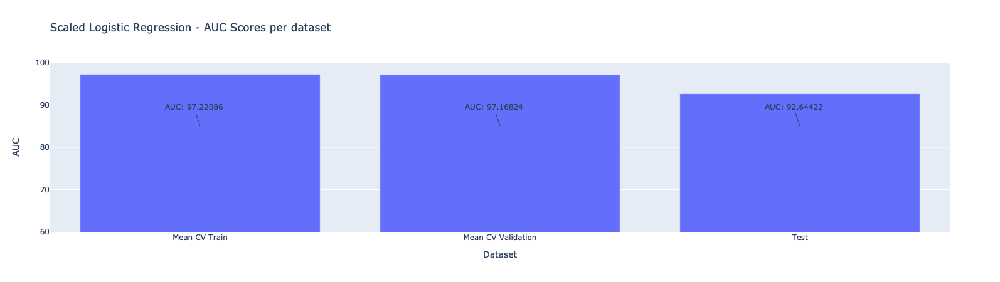

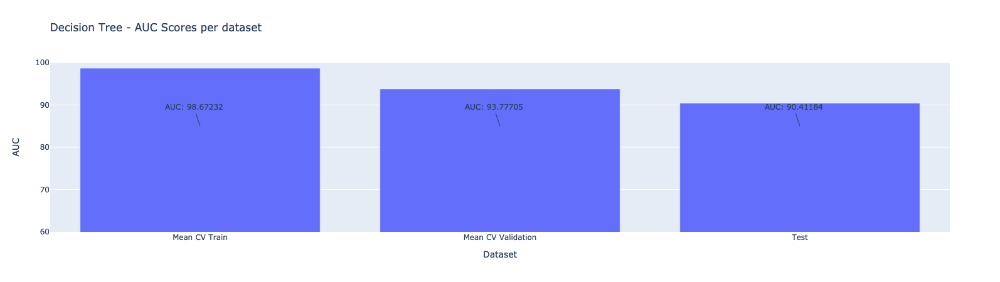

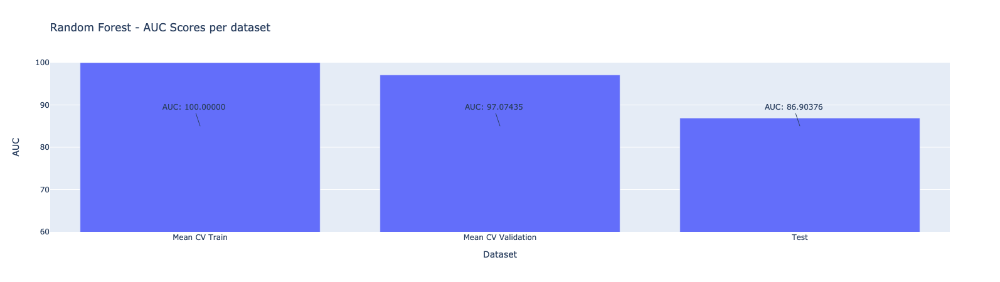

In [30]:
make_bar_plot_per_model(scaled_model, "Scaled Logistic Regression - AUC Scores per dataset")
make_bar_plot_per_model(dtc_model, "Decision Tree - AUC Scores per dataset")
make_bar_plot_per_model(random_forest_model, "Random Forest - AUC Scores per dataset")

### Scaled Logistic Regression

For this model, the best mean train/validation scores (train:0.972208,  validation: 0.971682) come from hyperparameter combination #9. To be exact, hyperparameter combination #10 had the same validation score, but Scikit Learn defaults to choosing the first combination in the case of a mean validation score tie.
It is apparent that this model is not overfitting since both train and validation scores are insignificantly different.  Also, the AUC score from the test dataset is not very far away from the best-fit validation scores. 

When looking at precision and recall for the individual classes, the model does better at being correct when predicting for class 1 vs class 0 (precision). This is to be expected because there is a large imbalance between the two classes.  As for recognizing each class, the model performs equally well for both classes. 




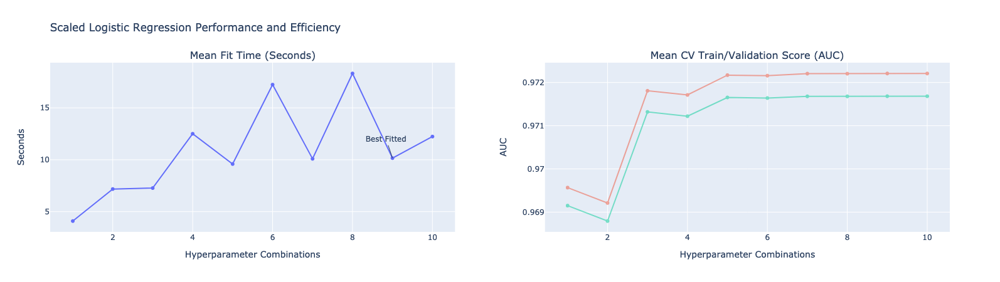

param_combination,rank_validation_score,mean_fit_time,param_model__solver,param_model__penalty,param_model__C,param_model__class_weight,param_model__max_iter,param_model__fit_intercept,mean_train_score,mean_validation_score
1,9,4.090099,lbfgs,l2,0.01,balanced,10000,True,0.969568,0.969151
2,10,7.175400,liblinear,l2,0.01,balanced,10000,True,0.969212,0.968794
3,7,7.271185,lbfgs,l2,0.1,balanced,10000,True,0.971808,0.971319
4,8,12.504685,liblinear,l2,0.1,balanced,10000,True,0.971712,0.971220
5,5,9.587530,lbfgs,l2,1,balanced,10000,True,0.972170,0.971654
6,6,17.239740,liblinear,l2,1,balanced,10000,True,0.972158,0.971640
7,3,10.091645,lbfgs,l2,10,balanced,10000,True,0.972205,0.971680
8,4,18.315440,liblinear,l2,10,balanced,10000,True,0.972204,0.971679
9,1,10.157330,lbfgs,l2,100,balanced,10000,True,0.972209,0.971682
10,2,12.235373,liblinear,l2,100,balanced,10000,True,0.972208,0.971682


Train AUC: 0.97218
Test result:
              precision    recall  f1-score   support

           0       0.64      0.93      0.76      2483
           1       0.99      0.93      0.96     17517

    accuracy                           0.93     20000
   macro avg       0.82      0.93      0.86     20000
weighted avg       0.95      0.93      0.93     20000

Test AUC: 0.92644


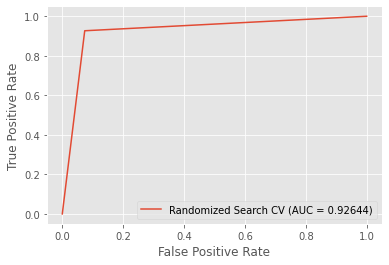

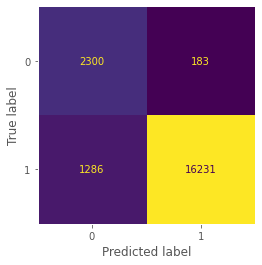

In [31]:
plot(scaled_summary, "Scaled Logistic Regression")
get_classification_report(X_train, y_train, X_test, y_test, y_hat_lg_scaled, search_lr_scaled)

### Decision Tree

For this model, the best mean train/validation scores (train:0.986723,  validation: 0.937770) come from hyperparameter combination #20. From looking at the "Mean CV Train/Validation Score" Plot, it can be seen that the model is overfitting the most when the min_sample_split hyperparameter is set at lower values.  Notice that for every combination with min_sample_split=2, the mean train score is 1.00 while the mean validation score is much lower. Notice that the model is definitely overfitting because even with higher min_sample_split values, hyperparameter combination #20 still results in a model with a 5 percentage point difference between best CV train and best CV validation, and the train AUC (the refitted model in all train data using the best hyperparameter combination) is almost 9 percentage points higher than the test AUC. 

When looking at precision and recall for the individual classes, the model is better at correctly predicting for class 1 vs class 0 (precision). This is to be expected because there is a large imbalance between the two classes. When it comes to recall, class one still performs slightly higher.


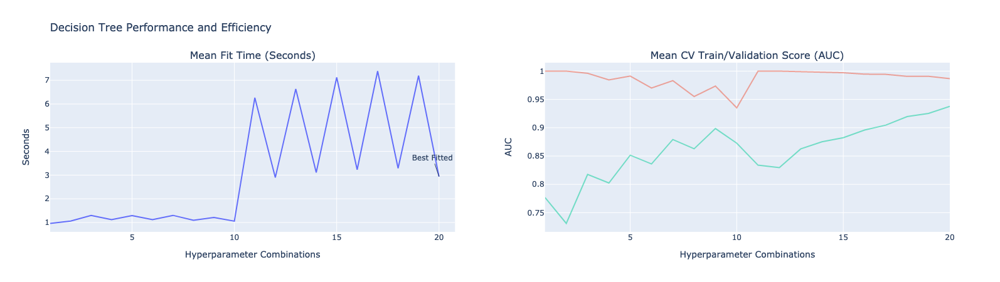

param_combination,rank_validation_score,mean_fit_time,param_model__splitter,param_model__min_samples_split,param_model__max_features,mean_train_score,mean_validation_score
1,19,0.961639,best,2,auto,1.000000,0.776749
2,20,1.063528,random,2,auto,1.000000,0.731012
3,17,1.299781,best,10,auto,0.996207,0.817470
4,18,1.123716,random,10,auto,0.984517,0.802392
5,13,1.292653,best,20,auto,0.991281,0.851531
6,14,1.118669,random,20,auto,0.970157,0.836076
7,8,1.301448,best,40,auto,0.983170,0.879244
8,11,1.096106,random,40,auto,0.955138,0.862886
9,5,1.212952,best,80,auto,0.973642,0.898632
10,10,1.056912,random,80,auto,0.935144,0.872763


Train AUC: 0.98642
Test result:
              precision    recall  f1-score   support

           0       0.61      0.89      0.72      2483
           1       0.98      0.92      0.95     17517

    accuracy                           0.92     20000
   macro avg       0.80      0.90      0.84     20000
weighted avg       0.94      0.92      0.92     20000

Test AUC: 0.90412


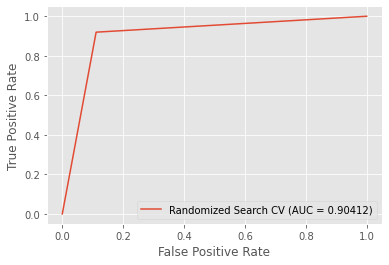

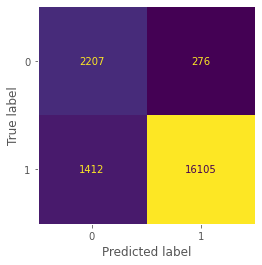

In [32]:
plot(dtc_summary, "Decision Tree")
get_classification_report(X_train, y_train, X_test, y_test, y_hat_dtc, search_dtc)

### Random Forest

For this model, the best mean train/validation scores (train: 1.0, validation:0.970744) come from hyperparameter combination #5. In this case, it is very noticeable that the model is overfitting the data.  When comparing the train AUC (model fitted using all the training data and best hyperparameters from CV) and the test AUC, we can see a 16 percentage point drop. 

When looking at precision and recall for the individual classes, similar to the other two models, class 1 performs better on both metrics. This is mainly due to the high class imbalance. 



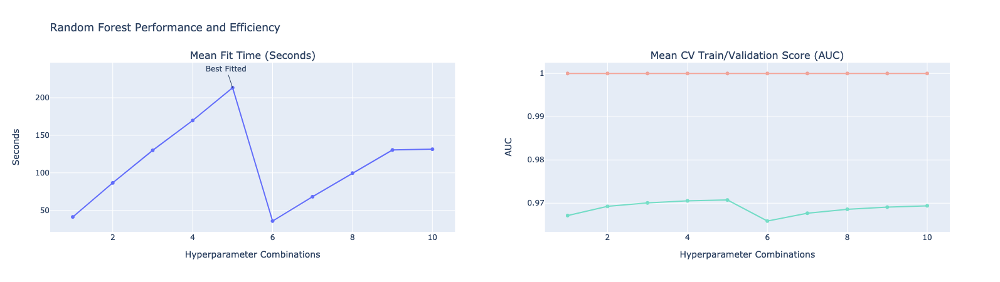

param_combination,rank_validation_score,mean_fit_time,param_model__n_estimators,param_model__max_features,mean_train_score,mean_validation_score
1,9,41.304901,100,auto,1.0,0.967138
2,5,86.637711,200,auto,1.0,0.969259
3,3,129.960351,300,auto,1.0,0.970066
4,2,169.693678,400,auto,1.0,0.970544
5,1,213.334486,500,auto,1.0,0.970744
6,10,35.797166,100,log2,1.0,0.965870
7,8,68.229547,200,log2,1.0,0.967681
8,7,99.649477,300,log2,1.0,0.968595
9,6,130.469183,400,log2,1.0,0.969086
10,4,131.454997,500,log2,1.0,0.969401


Train AUC: 1.00000
Test result:
              precision    recall  f1-score   support

           0       0.85      0.76      0.80      2483
           1       0.97      0.98      0.97     17517

    accuracy                           0.95     20000
   macro avg       0.91      0.87      0.89     20000
weighted avg       0.95      0.95      0.95     20000

Test AUC: 0.86904


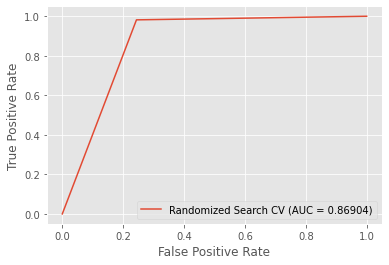

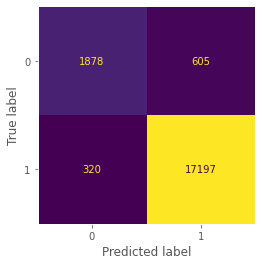

In [33]:
plot(random_forest_summary, "Random Forest")
get_classification_report(X_train, y_train, X_test, y_test, y_hat_rfc, search_rfc)

### `grade` as response

In [34]:
def get_auc_per_class(estimator, labels, x_test, y_test):
    # code source adapted from https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
    y_score = estimator.predict_proba(x_test)
    y_test = label_binarize(y_test, classes=labels)
    n_classes = len(labels)
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    return roc_auc, tpr, fpr, n_classes

#5, model,x_test, y_test

def compute_roc_Auc_Curve_per_class(n_classes, estimator, x_test, y_test, ):
    roc_auc, tpr, fpr, n_classes = get_auc_per_class(estimator, labels, x_test, y_test)
    lw = 2
    # Plot all ROC curves
    plt.figure()
    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=4)

    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=4)

    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', "green", "lightseagreen"])
    for i, color in zip(range(n_classes), colors):
        if i ==0:
            j = "A"
        elif i ==1:
            j="B"
        elif i ==2:
            j="C"
        elif i ==3:
            j="D"
        elif  i == 4:
            j="E-G"
        plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(j, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC  per class')
    plt.legend(loc="lower right")
    plt.show()

In [35]:
y_hat_rfc_g = search_rfc_g.predict(X_test_g)
y_hat_dtc_g = search_dtc_g.predict(X_test_g)
y_hat_slr_g = search_lr_scaled_g.predict(X_test_g)

class_list = ["A", "B","C","D","E-G"]

lr_results_cols = ["rank_test_score", "mean_fit_time", "param_model__solver", "param_model__penalty", "param_model__C","param_model__class_weight", "param_model__max_iter" ,"param_model__fit_intercept", "mean_train_score", "mean_test_score"]
search_rf_cols = ["rank_test_score", "mean_fit_time", "param_model__n_estimators", "param_model__max_features", "mean_train_score", "mean_test_score"]
search_dtc_cols = ["rank_test_score", "mean_fit_time", "param_model__splitter", "param_model__min_samples_split", "param_model__max_features", "mean_train_score", "mean_test_score"]

scaled_summary_g = add_text(cv_summary(search_lr_scaled_g, lr_results_cols),"lr")
random_forest_summary_g = add_text(cv_summary(search_rfc_g, search_rf_cols),"rf")
dtc_summary_g = add_text(cv_summary(search_dtc_g, search_dtc_cols),"dtc")

scaled_model_g= {
    "Mean CV Train": scaled_summary_g[scaled_summary_g["rank_validation_score"]==1].mean_train_score.values[0]*100 , 
    "Mean CV Validation": scaled_summary_g[scaled_summary_g["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc_per_class(search_lr_scaled_g,  class_list, X_test_g,y_test_g)[0]["micro"]*100
}

random_forest_model_g= {
    "Mean CV Train":  random_forest_summary_g[random_forest_summary_g["rank_validation_score"]==1].mean_train_score.values[0]*100, 
    "Mean CV Validation": random_forest_summary_g[random_forest_summary_g["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc_per_class(search_rfc_g,  class_list, X_test_g,y_test_g)[0]["micro"]*100
}

dtc_model_g = {
    "Mean CV Train":  dtc_summary_g[dtc_summary_g["rank_validation_score"]==1].mean_train_score.values[0]*100, 
    "Mean CV Validation": dtc_summary_g[dtc_summary_g["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc_per_class(search_dtc_g,  class_list, X_test_g,y_test_g)[0]["micro"]*100
}



#### Overview

Predicting grade is a multiclass problem for which we used roc_auc_ovr_weighted metric to make model selection and assessment. The one vs rest strategy calculates the AUC score for each class against the others. The weighted average (calculated based on the number of samples per grade) is computed for all AUCs and turned into a single number.

As seen from the results below, for predicting grade, the test AUC for all the 3 best-fitted estimators range from 72% to 81%. The model with the highest test AUC score is the Random Forest model with 81.18%.  The second and third place for test AUC goes to the Scaled Logistic Regression and the Decision Tree respectively (78.42%, 72.89%). 

Out of the three trained models, the one with the longest training time was the Scaled Logistic Regression, which took around 19 minutes. This fitted 150 times with 15 different combinations. The Random Forest Model took about 16 minutes to complete its training. It fitted 100 times with 10 different hyperparameter combinations. The Decision Tree had the shortest training time, only lasting a little over one minute, fitting 200 times with 20 different hyperparameter combinations. 


| Model | Training Time |Number of Fits|Hyperparameter Combination|
| --- | --- |---|---|
| Random Forest | 16min 24s |100|10|
| Scaled Logistic Regression | 19min 19 |150|15|
| Decision Tree | 1min 24s |200|20|





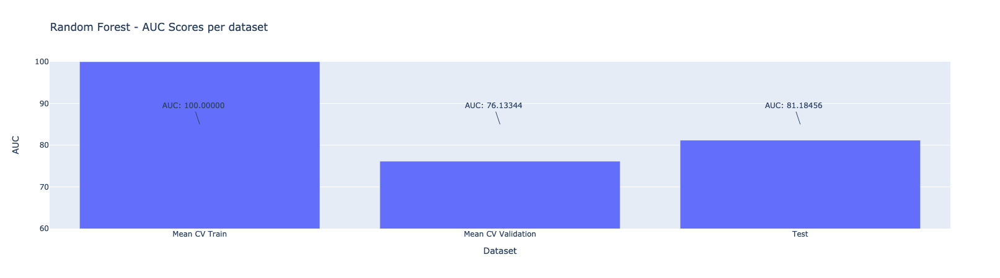

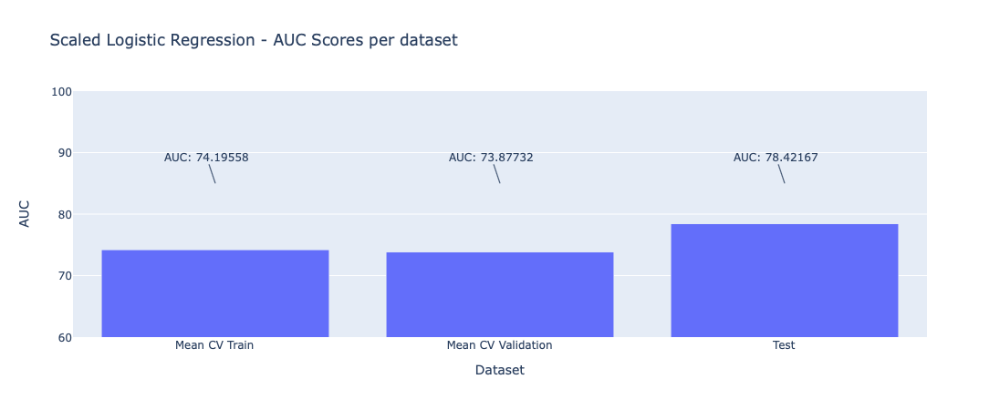

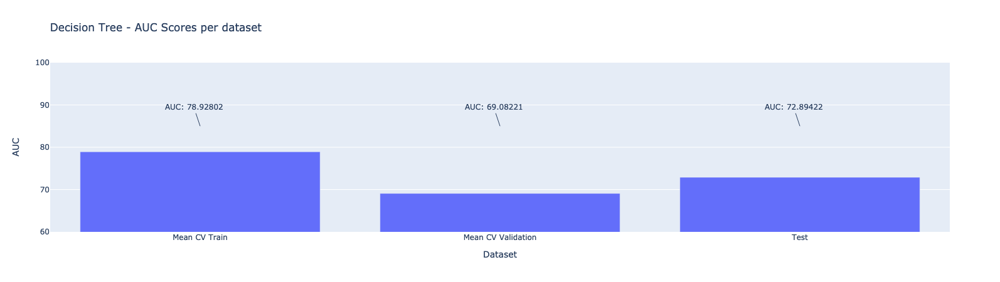

In [36]:
make_bar_plot_per_model(random_forest_model_g, "Random Forest - AUC Scores per dataset")
make_bar_plot_per_model(scaled_model_g, "Scaled Logistic Regression - AUC Scores per dataset")
make_bar_plot_per_model(dtc_model_g, "Decision Tree - AUC Scores per dataset")


#### Random Forest

For this model, the best mean train/validation scores (train:1, validation: 0.761334) come from hyperparameter combination #5. From looking at the "Mean CV Train/Validation Score" Plot and the hyperparameter table, it can be seen that the model is overfitting on every single combination. The average difference between the mean train score and the mean validation score is around 25 percentage points. 
Even if this model is overfitting in the train data, according to our results using the test dataset, this is still the best model out of all.  There is a possibility that the test results are a little over-optimistic and happen due to chance. 

When looking at precision and recall for the individual classes, the model does the best job on both metrics for class A (precision:66%, recall:64%) and the worst job for class D (precision:39%, recall:08%)  

Of the three chosen models predicting grade, the random forest model has the lowest accuracy within classes D and E-G. If accuracy within these particular classes is important to someone applying our models, the graph of accuracy within class clearly shows the disadvantage of the random forest model. The confusion matrix heatmap illustrates that the majority of class E-G and class D were both misclassified into class C.


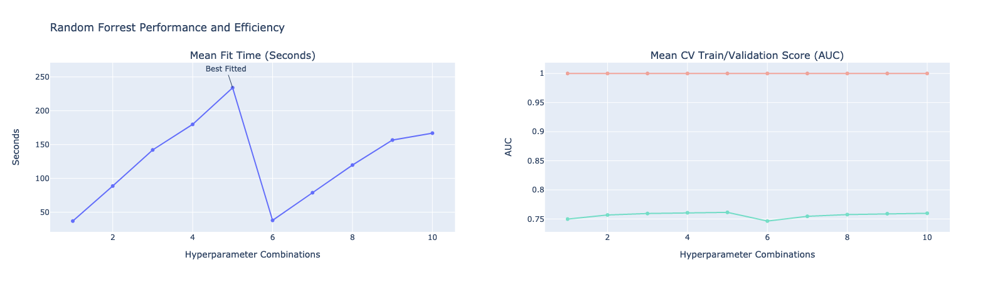

param_combination,rank_validation_score,mean_fit_time,param_model__n_estimators,param_model__max_features,mean_train_score,mean_validation_score
1,9,36.915134,100,auto,1.0,0.749790
2,7,88.719609,200,auto,1.0,0.756829
3,4,142.072751,300,auto,1.0,0.759386
4,2,179.861961,400,auto,1.0,0.760682
5,1,234.027529,500,auto,1.0,0.761334
6,10,37.908552,100,log2,1.0,0.746399
7,8,78.831730,200,log2,1.0,0.754540
8,6,119.741936,300,log2,1.0,0.757535
9,5,156.661134,400,log2,1.0,0.759036
10,3,166.889582,500,log2,1.0,0.759784


Train AUC: 1.00000
Test result:
              precision    recall  f1-score   support

           A       0.66      0.64      0.65      4730
           B       0.44      0.53      0.48      5845
           C       0.41      0.57      0.48      5499
           D       0.39      0.08      0.13      2781
         E-G       0.48      0.11      0.17      1145

    accuracy                           0.48     20000
   macro avg       0.48      0.39      0.38     20000
weighted avg       0.48      0.48      0.45     20000



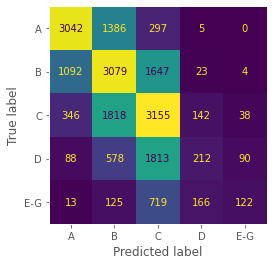

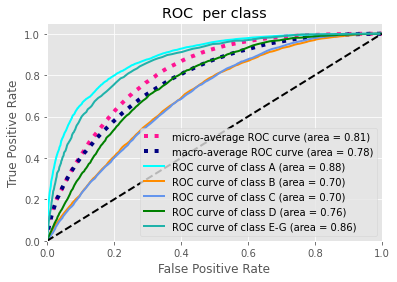

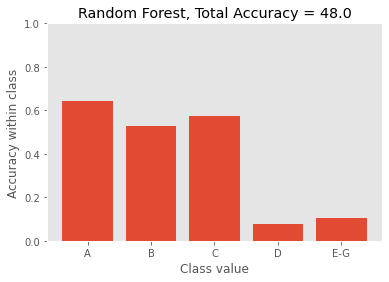

In [37]:
# Get grid search result
plot(random_forest_summary_g, "Random Forrest")
get_classification_report_multi_response(X_train_g, y_train_g, X_test_g, y_test_g, y_hat_rfc_g, search_rfc_g)
plot_class_acc(y_test_g,y_hat_rfc_g,title="Random Forest")

#### Decision Tree

For this model, the best mean train/validation scores (train:0.789280, validation: 0.690822) come from hyperparameter combination #20. From looking at the "Mean CV Train/Validation Score" Plot it can be seen that the model is overfitting for certain combinations but in general delivering weak results across the board. 

When looking at precision and recall for the individual classes, the model does the best job on both metrics for class A (precision:58%, recall:64%) and a mix and match of worse results on either metric for the rest of the classes.  

The graph of accuracy within class clearly communicates the improvement of accuracy within classes D and E-G over the previous random forest model. It also illustrates the reduced accuracy of class C predictions when compared to the random forest model. The confusion matrix heatmap clarifies this trade-off. Substantially more true class C loans are being misclassified into classes D and E-G than were in the random forest model. If misclassification of true C class loans is a concern for someone applying our model, this may indicate our decision tree is not the best choice.

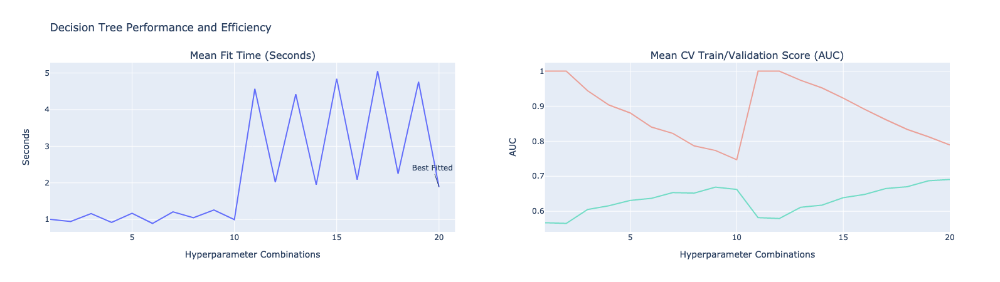

param_combination,rank_validation_score,mean_fit_time,param_model__splitter,param_model__min_samples_split,param_model__max_features,mean_train_score,mean_validation_score
1,19,1.003878,best,2,auto,1.000000,0.567440
2,20,0.944648,random,2,auto,1.000000,0.565437
3,16,1.159831,best,10,auto,0.944125,0.605140
4,14,0.921834,random,10,auto,0.903434,0.615811
5,12,1.167640,best,20,auto,0.880643,0.630996
6,11,0.892869,random,20,auto,0.840378,0.637041
7,7,1.208753,best,40,auto,0.822218,0.653425
8,8,1.048889,random,40,auto,0.786754,0.651865
9,4,1.259545,best,80,auto,0.773580,0.668928
10,6,0.996598,random,80,auto,0.747171,0.662422


Train AUC: 0.78970
Test result:
              precision    recall  f1-score   support

           A       0.58      0.64      0.61      4730
           B       0.43      0.31      0.36      5845
           C       0.36      0.21      0.26      5499
           D       0.22      0.30      0.25      2781
         E-G       0.15      0.47      0.23      1145

    accuracy                           0.37     20000
   macro avg       0.35      0.39      0.34     20000
weighted avg       0.40      0.37      0.37     20000



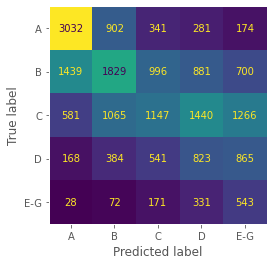

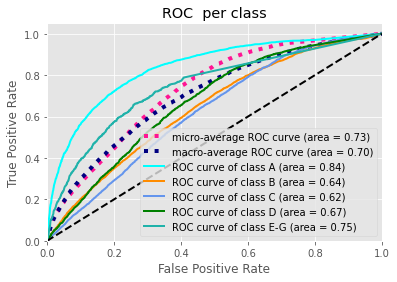

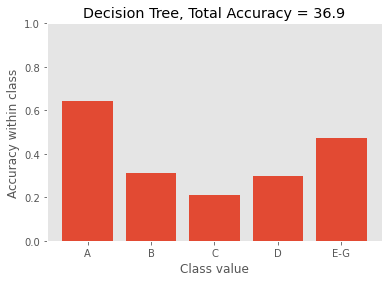

In [38]:
plot(dtc_summary_g, "Decision Tree")
get_classification_report_multi_response(X_train_g, y_train_g, X_test_g, y_test_g, y_hat_dtc_g, search_dtc_g)
plot_class_acc(y_test_g,y_hat_dtc_g,title="Decision Tree")

#### Scaled Logistic Regression

For this model, the best mean train/validation scores (train:0.741956, validation: 0.738773) come from hyperparameter combination #3. From looking at the "Mean CV Train/Validation Score" Plot it can be seen that the model is pretty stable in maintaining a small difference between mean train and validation throughout all the 15 combinations, but when comparing the train AUC (refitted on all training dataset using best parameters) vs the test AUC we noted that the test score (0.78) is higher than train score (0.74). This suggests that the model might be underfitting and that the reason for a higher score on the test set might be due to chance.  

When looking at precision and recall for the individual classes, the model does the best job on both metrics for class A (precision:58%, recall:64%) and a mix and match of bad results on either metric for the rest of the classes.  

The graph of accuracy within class shows an increase in accuracy when predicting E-G compared to the decision tree and random forest models; however, the accuracy of predictions for class D declined. While scaled logistic regression shows an improvement in class C accuracy compared to decision tree, random forest still had the highest accuracy for that particular class. If accuracy in identifying class E-G is a priority for someone applying our model, this graph shows the relative advantage of scaled logistic regression over the other two models. The confusion matrix heatmap shows 622 of 1,145 class E-G labels were correctly identified. Of course, there were many actual A through D cases misclassified as E-G as well.

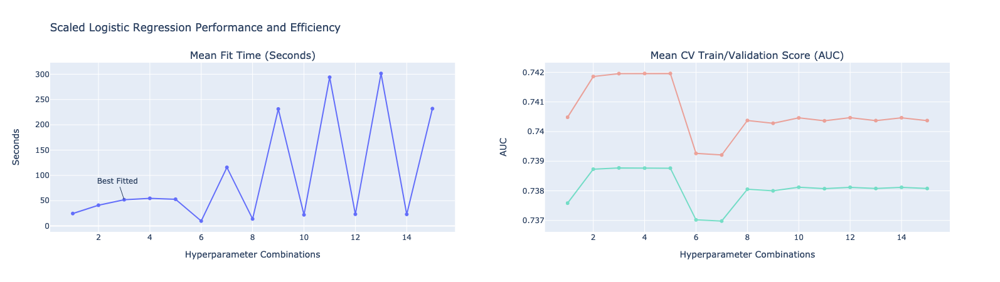

param_combination,rank_validation_score,mean_fit_time,param_model__solver,param_model__penalty,param_model__C,param_model__class_weight,param_model__max_iter,param_model__fit_intercept,mean_train_score,mean_validation_score
1,13,24.636175,liblinear,l2,0.01,balanced,10000,True,0.740483,0.737585
2,4,41.039058,liblinear,l2,0.1,balanced,10000,True,0.741858,0.738731
3,1,51.938436,liblinear,l2,1,balanced,10000,True,0.741956,0.738773
4,2,54.700076,liblinear,l2,10,balanced,10000,True,0.741960,0.738767
5,3,52.859589,liblinear,l2,100,balanced,10000,True,0.741960,0.738764
6,14,9.739576,lbfgs,l2,0.01,balanced,10000,True,0.739262,0.737020
7,15,115.858970,saga,l2,0.01,balanced,10000,True,0.739210,0.736980
8,11,13.926006,lbfgs,l2,0.1,balanced,10000,True,0.740374,0.738054
9,12,231.233842,saga,l2,0.1,balanced,10000,True,0.740280,0.737999
10,5,22.072379,lbfgs,l2,1,balanced,10000,True,0.740462,0.738121


Train AUC: 0.74183
Test result:
              precision    recall  f1-score   support

           A       0.56      0.75      0.64      4730
           B       0.45      0.33      0.38      5845
           C       0.41      0.36      0.38      5499
           D       0.28      0.20      0.23      2781
         E-G       0.25      0.54      0.34      1145

    accuracy                           0.43     20000
   macro avg       0.39      0.44      0.40     20000
weighted avg       0.43      0.43      0.42     20000



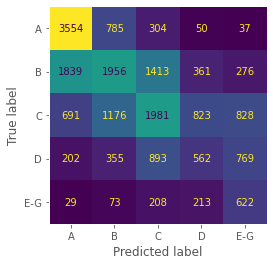

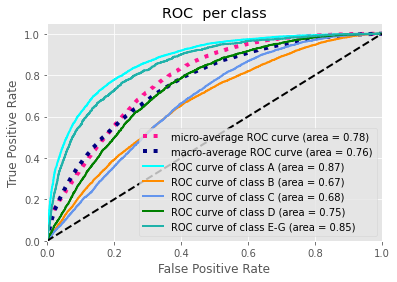

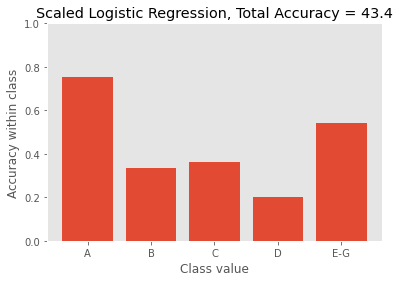

In [39]:
plot(scaled_summary_g, "Scaled Logistic Regression")
get_classification_report_multi_response(X_train_g, y_train_g, X_test_g, y_test_g, y_hat_slr_g, search_lr_scaled_g)
plot_class_acc(y_test_g,y_hat_slr_g,title="Scaled Logistic Regression")

# Modeling and Evaluation 5

In [40]:
def draw_bell_curve(t):
    x = np.arange(-30, 30, 0.001)
    y = scipy.stats.norm.pdf(x,0,1)
    data =  {"x":x, "y":y}
    df = pd.DataFrame(data)
    #fig, ax = plt.subplots(figsize=(9,6))
    fig = px.scatter(df, "x", "y")
    fig.add_vline(x=t)
    fig.add_annotation(text=f"t-value: {t:.1f}",x=t-2, y=0.03)
    fig.show()

## Advantages of each model - Comparing good_loan_or_not

Looking at the confusion matricies, training curves over time vs model complexity, and ROC curves for the Decision Tree, Random Forest, and Scaled Logistic Regression models above, different advantages for each model emerge. 

<h4>Decision Tree Advantages/Disadvantages</h4>

**In Theory:** 
- Easy to interpret 
- Very Fast to train compared to other models. 
- Easy to extract feature importance.
- Multicollinearity can affect variable importance.  


**Specific to our Model:** 
- Training Cross validation score (ROC AUC) is high, but CV Validation AUC dips a bit, Test validation AUC is even lower. This suggests that even though we have used hyperparameters to control overfitting, there is still some overfitting contributing to model variance. 
- Training time for our best fit combination of hyperparameters was only 3 seconds. This is very fast for a fold with 9,000 samples to train. It was >3X faster than our best fit for Logistic Regression and 50X faster than our best fit for Random Forest. 
- Easy to extract feature important. Especially when compared to Random Forest or even Logistic Regression, we can describe to stakeholders which features are most important and in what order our model makes its decisions.
- Because this is a binary classification problem, we can consider Precision. When compared to random forest and logistic regression, the test macro precision (0.8) was lower than both Random Forest and Logistic Regression. Because we optimized for ROC AUC, macro precision may be lower simply because Sensitivity and Specificity are optimized in an attempt to mitigate the effects of an imbalanced dataset. 



<h4>Random Forest Advantages/Disadvantages</h4>

**In Theory:** 
- Reduced Variance (Overfitting) when compared to decision tree. 
- Still relatively fast to train 
- (similar to decision tree). Known for being easy to extract feature importance from
- Multicollinearity can affect variable importance.  

**Specific to our Model:** 
- Very High Training ROC AUC score (AUC = 1). CV Validation is still very high. However, a steep drop off is noted between the validation and test AUC (Test AUC is ~.86). This suggests again that there was overfitting occurring. When compared to the other models, Random Forest had the worst Test AUC. This suggests that our Random Forest model has a high degree of variance. In theory Random Forest should be less prone to overfitting than Decision Tree. It is likely that decision tree outperformed Random Forest due to the particular Grid of hyperparameters that were evaluated.  
- Mean Fit time was over 210 seconds per fold. This was the slowest of the three algorithms we tried. 
- Because this is a binary classification problem, we can consider Precision. When compared to decision tree and logistic regression, the test macro precision (0.91) was noticeably higher than both Decision tree and Logistic Regression. When considered in combination with the fact that the test ROC AUC is lower than the other two models, this increase in precision may indicate that class imbalance is affecting our Random Forest more than the other models. 
 
<h4>Scaled Logistic Regression Advantages/Disadvantages</h4>  

**In Theory:** 
- Provides a very easy way to interpret multivariate model parameters. This includes a directionality measurement of the positive or negative contribution of a parameter to the final prediction.  
- Requires Linear Separability to be effective. 
- Multicollinearity can affect variable importance.  
- There are no assumptions of normality for the dependent variable.  
- Very efficient training time.  
- Works very well for linear separable binary classifications such as predicting good or bad loan

**Specific to our Model:** 
- Somewhat high Training ROC AUC score (AUC = .972). CV Validation is still very high (almost exactly the same as the training AUC). There is a drop off between the validation and test AUC (Test AUC is ~.92). This drop off is not as steep as the drop for Random Forest, suggesting that Logistic Regression is overfitting, but it is overfitting less than Random Forest. When compared to the other models, Logistic Regression, although it overfits, still performs the best on both its validation sets for cross validation as well as the test ROC AUC. This suggests it is our top predicting performer when the goal is the optimal balance between sensitivity and specificity. 
- Mean Fit time was over 10 seconds per fold for our best fit. This was slower than decision tree but still much faster than Random Forest. 
- Because this is a binary classification problem, we can consider Precision. When compared to decision tree and logistic regression, the test macro precision was modestly higher than Decision tree (0.82) but still lower than Random Forest. Similar to decision trees, because we optimized for ROC AUC, macro precision may be lower simply because Sensitivity and Specificity are optimized in an attempt to mitigate the effects of an imbalanced dataset. 
 
Based on these conclusions, we have chosen Scaled Logistic Regression as our top performing classifier for `good_loan_or_not`. The second best classifier would be Decision Tree due to its fast training time and relatively high ROC values. 

In [42]:
%%time
# Best for good_loan_or_not

t, p = paired_ttest_5x2cv(estimator1=search_dtc.estimator.set_params(**search_dtc.best_params_),
                estimator2=search_lr_scaled.estimator.set_params(**search_lr_scaled.best_params_).set_params(model__n_jobs=-1),
                X=X_train.values, y=y_train.values,scoring='roc_auc',random_seed=1)

acc1_single = cross_val_score(search_dtc.estimator.set_params(**search_dtc.best_params_), X_train, y=y_train, cv=cv,
                       scoring="roc_auc")
acc2_single = cross_val_score(search_lr_scaled.estimator.set_params(**search_lr_scaled.best_params_).set_params(model__n_jobs=-1), X_train, y=y_train, cv=cv,
                      scoring="roc_auc")

CPU times: user 47.7 s, sys: 3.83 s, total: 51.6 s
Wall time: 3min 33s


t-value: -24.65, p-value:0.00, Mean AUC score Decision Tree:0.94, Mean AUC score Logistic Regression: 0.97


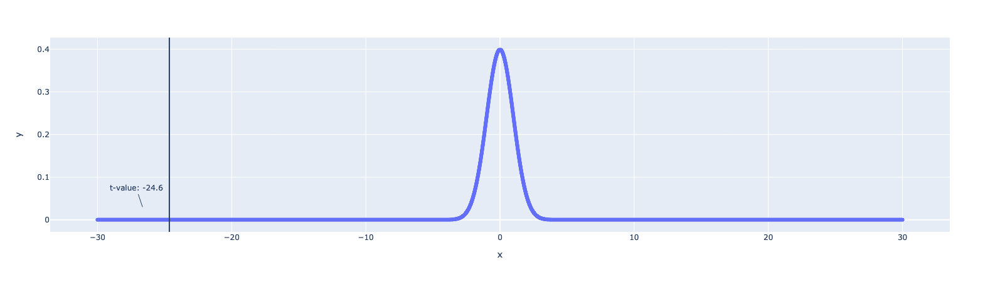

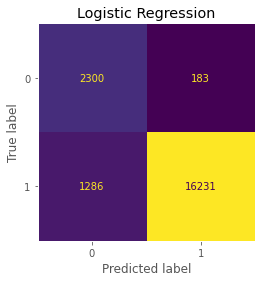

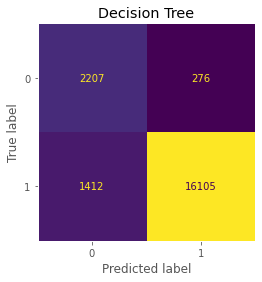

In [43]:
print(f"t-value: {t:.2f}, p-value:{p:.2f},", f"Mean AUC score Decision Tree:{np.mean(acc1_single):.2f},",
      f"Mean AUC score Logistic Regression: {np.mean(acc2_single):.2f}" )
draw_bell_curve(t)

plot_confusion_matrix(search_lr_scaled, X_test, y_test,colorbar=False)
plt.grid(None)
plt.title("Logistic Regression")


plot_confusion_matrix(search_dtc, X_test, y_test,colorbar=False)
plt.grid(None)
plt.title("Decision Tree")
None

<h3>Statistical Comparison of Decision Tree vs Scaled Logistic Regression </h3>  
For the binary classification of "good_loan_or_not", we decided to do statistical comparison on the top two performing models on the test set. We used ROC AUC (area under the ROC curve) as our scoring function (for 10-fold stratified cross-validation). For the statistic test of significance, we used the mlextend paired_ttest_5x2cv function which does the comparison between the two models by obtaining AUC results from splitting the training data into the train (using 50% of the data) and validation (using 50% of the data) 5 different times and performing a paired t-test on the results of this new 5-fold cross validation. This method reduced the independence assumption (training set overlap) violation and is recommended on the documentation. More on this algorithm can be found:

Resource: http://rasbt.github.io/mlxtend/user_guide/evaluate/paired_ttest_5x2cv/

Comparing Scaled Logistic Regression and Decision Tree: 

When comparing our "Best" Model (Scaled Logistic Regression) with our second best model (Decision Tree) based on test set using the statistical 5x2CV test mentioned above to test for statistical difference given ROC is our scoring function, there is sufficient evidence at the alpha = .05 level (p-value << 0.01 from the paired t-test) that the mean area under (AUC) of the Decision Tree is statistically significantly different when compared to the mean area under the curve (AUC) of the Scaled Logistic Regression model. We can reject the hypothesis that the two classifiers are equal (with ROC AUC as the metric).

## Advantages of each model - Comparing Grade

When predicting grade which is multiclass, our models were evaluated with `roc_auc_ovr_weighted` which calculates a weighted average ROC AUC for all classes per fold for the binary relationship of one versus rest.


<h4>Decision Tree Advantages/Disadvantages</h4>

**In Theory:** 
- Easy to interpret 
- Very Fast to train compared to other models. 
- Easy to extract feature importance.
- Multicollinearity can affect variable importance.  


**Specific to our Model:** 
- Training Cross validation score (ROC AUC) is moderately high, but CV Validation AUC dips noticeably (from .79 to .69), Test validation AUC is actually higher. This suggests, that even though we have used hyperparameters to control overfitting, there is still some overfitting contributing to model variance in the cross validated results. With regards to the test set, it is likely that the overfitting which occurred with the decision tree model was minor, because the algorithm got a “lucky split” and outperformed the cross-validation results.  

- Training time for our best fit combination of hyperparameters was only 2 seconds. This is VERY fast for a fold with 9,000 samples to train. It was >25X faster than our best fit for Logistic Regression and >100X faster than our best fit for Random Forest. 
- It is easy to extract feature importance. Especially when compared to Logistic Regression, we can describe to stakeholders which features are most important and in what order our model makes its decisions.
- When considering Micro-Average vs Macro-average ROC AUC for a cross validated set, we can see that the micro-average AUC for Decision Tree is .73 where macro-average is .7. This suggests that class imbalance is not affecting the Decision tree model too much. Of note, the micro-average ROC AUC for decision tree is lower than Random Forest and lower than Scaled Logistic Regression.



<h4>Random Forest Advantages/Disadvantages</h4>

**In Theory:** 
- Reduced Variance (Overfitting) when compared to decision tree. 
- Still relatively fast to train 
- (similar to decision tree). Known for being easy to extract feature importance from
- Multicollinearity can affect variable importance.  

**Specific to our Model:** 
- Training Cross validation score (ROC AUC) is extremely high (AUC=1), but CV Validation AUC dips noticeably (to .76), Test validation AUC is actually higher at 0.812. This suggests, like decision tree, that even though we have used hyperparameters to control overfitting, there is still significant overfitting contributing to model variance in the cross validated results. With regards to the test set and again similar to decision tree, it is likely that the overfitting which occurred with the decision tree model was minor, because the algorithm got a “lucky split” and outperformed the cross-validation results.  Although it is obvious that our model is overfitting relatively strongly, the AUC for Random Forest is still our highest for predicting grade of all the models we compared grids for. 

- Training time for our best fit combination of hyperparameters was over ~230 seconds per fold for our best fit. This was our slowest model to train a fold with 9,000 samples. It was ~5X slower than our best fit for Logistic Regression and ~100X slower than our best fit for Random Forest. 
- Similar to decision trees and logistic regression, it is easy to extract feature importance. 
- When considering Micro-Average vs Macro-average ROC AUC for a cross validated set, we can see that the micro-average AUC for Random Forest is .81 where macro-average is .78. This suggests that class imbalance is not affecting our Random Forest model too much. Of note, the micro-average ROC AUC for Random Forest is higher than Decision tree and higher than Scaled Logistic Regression.

<h4>Scaled Logistic Regression Advantages/Disadvantages</h4>  

**In Theory:** 
- Provides a very easy way to interpret multivariate model parameters. This includes a directionality measurement of the positive or negative contribution of a parameter to the final prediction. Similar to decision trees and random forest, it is fairly easy to extract feature importance. However in this case, we can only look at parameter estimates, and P-significance values may be ignored for estimates. This is a gap with feature importance for Logistic Regression. 
- Requires Linear Separability to be effective. 
- Multicollinearity can affect variable importance.  
- There are no assumptions of normality for the dependent variable.  
- Efficient training time.  
- Works very well for linear separable binary classifications such as predicting good or bad loan

**Specific to our Model:** 
- Training Cross validation score (ROC AUC) is modest (AUC=0.7412). CV Validation AUC dips very little (to .73). Test validation AUC is, similar to the other models, higher at 0.784. This suggests, unlike our other models, there is actually very little overfitting going on in our Logistic Regression model. With regards to the test set, again similar to decision tree, it is likely that the test split algorithm got a “lucky split” and outperformed the cross-validation results.  

- Training time for our best fit combination of hyperparameters was over ~50 seconds per fold for our best fit. This was not our slowest model and also not our fastest. To note, with other hyperparameter combinations, the training time for Scaled Logistic Regression was significantly higher. 
- When considering Micro-Average vs Macro-average ROC AUC for a cross validated set, we can see that the micro-average AUC for Random Forest is .78 where macro-average is .76. This suggests that class imbalance is not affecting our Scaled Logistic Regression model too much. Of note, the micro-average ROC AUC for Scaled Logistic Regression is higher than Decision tree but lower than Random Forest.

Conclusion:  Although it is obvious that our model is overfitting relatively strongly, the AUC for Random Forest is still our highest for predicting grade of all the models we compared grids for. It is our first choice for a model predicting the multiclass output of grade. Our second strongest model is Scaled Logistic Regression mostly due to its comparably high ROC AUC. 


In [41]:
%%time

acc1 = cross_val_score(search_rfc_g.estimator.set_params(**search_rfc_g.best_params_).set_params(model__n_jobs=-1), X_train_g, y=y_train_g, cv=cv,
                       scoring="roc_auc_ovr_weighted")
acc2 = cross_val_score(search_lr_scaled_g.estimator.set_params(**search_lr_scaled_g.best_params_).set_params(model__n_jobs=-1), X_train_g, y=y_train_g, cv=cv,
                      scoring="roc_auc_ovr_weighted", )

CPU times: user 3min 33s, sys: 45 s, total: 4min 18s
Wall time: 4min 44s


t-value: 16.54, p-value:0.00, Mean AUC score Decision Tree:0.76, Mean AUC score Logistic Regression: 0.74


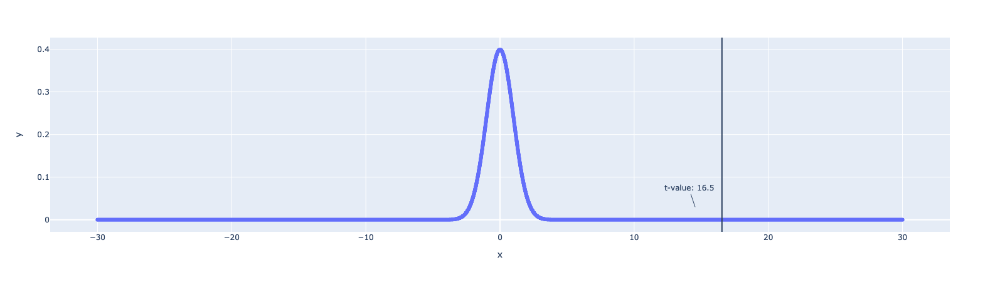

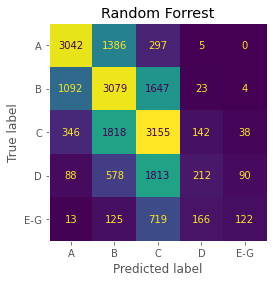

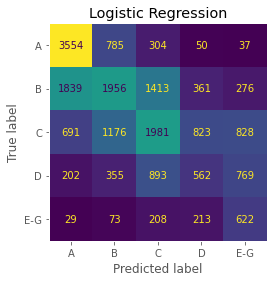

In [42]:
t_g, p_g = paired_ttest_5x2cv(estimator1=search_rfc_g.estimator.set_params(**search_rfc_g.best_params_).set_params(model__n_jobs=-1),
                estimator2=search_lr_scaled_g.estimator.set_params(**search_lr_scaled_g.best_params_).set_params(model__n_jobs=-1),
                X=X_train_g.values, y=y_train_g.values,scoring='roc_auc_ovr_weighted',random_seed=1)
print(f"t-value: {t_g:.2f}, p-value:{p_g:.2f},", f"Mean AUC score Decision Tree:{np.mean(acc1):.2f},",
      f"Mean AUC score Logistic Regression: {np.mean(acc2):.2f}" )
draw_bell_curve(t_g)
plot_confusion_matrix(search_rfc_g, X_test_g, y_test_g,colorbar=False)
plt.grid(None)
plt.title("Random Forrest")

plot_confusion_matrix(search_lr_scaled_g, X_test_g, y_test_g,colorbar=False)

plt.grid(None)
plt.title("Logistic Regression")
None

<h3>Statistical Comparison of Random Forest vs Scaled Logistic Regression </h3> 

With multi-class classification, we also decided to do statistical comparison on the top two performing models on the test set. We have used ROC AUC One-Versus-Rest as our scoring function (for 10-fold stratified cross-validation). As such we have broken each class for the ‘grade’ into a binary classification problem where the Precision of the prediction for a particular grade is compared to the True Negative rate for the “rest” of the grades. As such, a no-information rate for a random classifier would produce an area under the curve of .5 for each class.

Again we used the paired_ttest_5x2cv for the statistical comparison between our two best models (Scaled Logistic Regression and the even better Random Forest model). We obtained the weighted AUC results from a 5 fold CV and a paired t-test on the weighted One versus Rest ROC AUC of those CV. 

There is sufficient evidence at the alpha = .05 level of significance (p-value = 0.00 from the paired t-test) that the mean area under the curve (AUC) for one vs rest of the Random Forest is different from the  mean area under the curve (AUC) for one vs rest of the Logistic Regression model

Looking at the confusion matrix above, the correct of classification instances for the letters B and C on the Random Forest model is greater than in the Logistic Regression by almost 40%, while the correct classification for letter A is greater in the Logistic Regression by 15%.

# Modeling and Evaluation 6
#### Model Feature Importance

In [41]:
# Helper Functions
def plot_coefficients(feature_importances, top_features, title):
    feature_importances.sort(key=lambda x:x[1])
    top_positive_feature_importances = feature_importances[-top_features:]
    top_negative_feature_importances = feature_importances[:top_features]
    top_feature_importances = top_negative_feature_importances + top_positive_feature_importances
    unziped_top_feature_importances = list(zip(*top_feature_importances))
    unziped_top_feature_names = np.array(list(unziped_top_feature_importances[0]))
    unziped_top_feature_estimates= np.array(list(unziped_top_feature_importances[1])).astype(float)
    
    # create plot
    plt.figure(figsize=(18, 8))
    colors = ['red' if feature_estimate < 0 else 'blue' 
              for (feature_name, feature_estimate) in top_feature_importances]
    
    plt.bar(unziped_top_feature_names, unziped_top_feature_estimates, color=colors)
    plt.xticks(np.arange(0,  2 * top_features), unziped_top_feature_names, rotation=75, ha='right')
    plt.title(title)
    plt.show()

def plot_coefficients_only_positive(feature_importances, top_features, title):
    feature_importances.sort(key=lambda x:x[1])
    top_positive_feature_importances = feature_importances[-top_features:]
    unziped_top_feature_importances = list(zip(*top_positive_feature_importances))
    unziped_top_feature_names = np.array(list(unziped_top_feature_importances[0]))
    unziped_top_feature_estimates= np.array(list(unziped_top_feature_importances[1])).astype(float)
    
    # create plot
    plt.figure(figsize=(18, 8))
    colors = ['red' if feature_estimate < 0 else 'blue' 
              for (feature_name, feature_estimate) in top_positive_feature_importances]
    
    plt.bar(unziped_top_feature_names, unziped_top_feature_estimates, color=colors)
    plt.xticks(np.arange(0, top_features), unziped_top_feature_names, rotation=75, ha='right')
    plt.title(title)
    plt.show()

#### Scaled Logistic Regression: `Good_Loan_Or_Not`

### Extracting Importance: Overall Algorithm
    
To assess feature importance for our scaled Logistic Regression model predicting `Good_Loan_Or_Not`, we decided to display Logistic Regression since it is the best performing model on test set. For our Scaled Logistic Regression model, we extracted feature importance via variable estimates for our encoded and standardized variables. We then plotted the relative feature importance of numerical and categorical variables independently. This was done because while we standardized our numerical variables, we implemented a one hot encoding strategy for our categorical variables. As such, the two types of variables are on different scales. Subsequently, we plotted the 12 most important categorical variables and 8 most important numerical variables. 

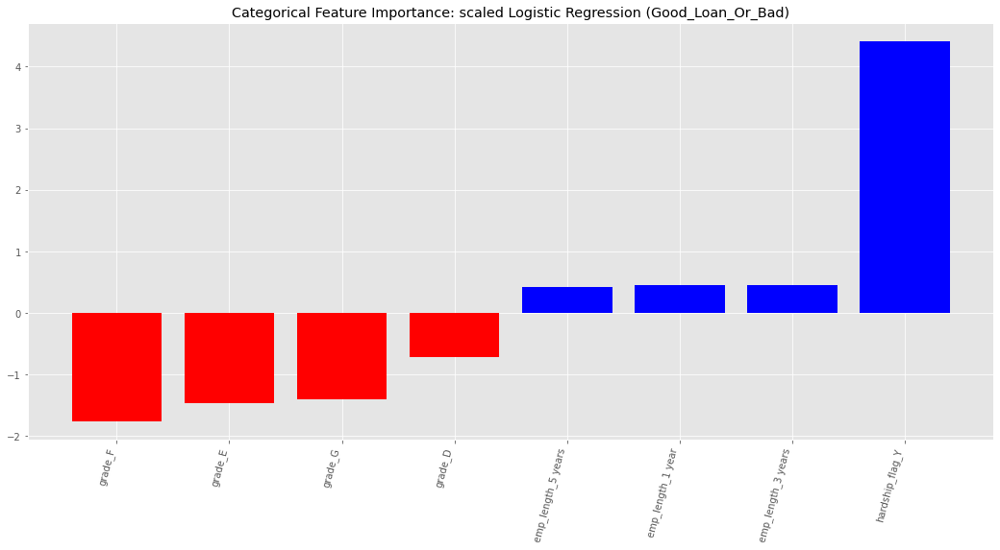

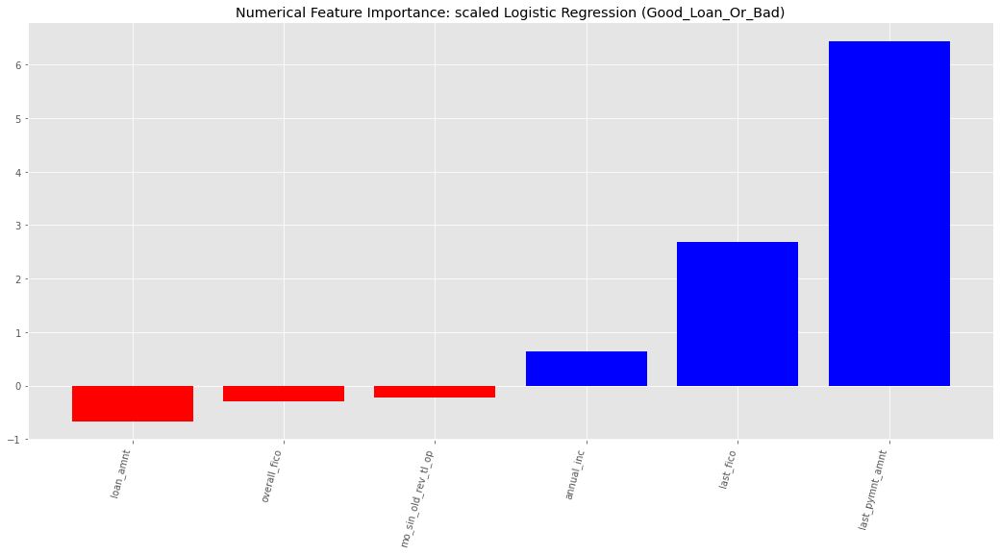

In [42]:
best_estimator = search_lr_scaled.best_estimator_
column_transformer = best_estimator.named_steps['preprocessing']
cat_transformer = column_transformer.named_transformers_['cat']
onehot_columns=cat_transformer.get_feature_names(input_features=categorical_col)
features_list = list(onehot_columns)
features_list.extend(numeric_col)
variable_importance_model = best_estimator.named_steps['model']
feature_importances = [feature_importance for feature_importance in zip(features_list, variable_importance_model.coef_.ravel())]


cat_feature_importances = [(feature_name, feature_estimate) 
                           for feature_name, feature_estimate in feature_importances 
                      if any(category in feature_name for category in categorical_col)]

numerical_feature_importances = [(feature_name, feature_estimate) 
                           for feature_name, feature_estimate in feature_importances 
                      if not any(category in feature_name for category in categorical_col)] 

plot_coefficients(cat_feature_importances, 4, 'Categorical Feature Importance: scaled Logistic Regression (Good_Loan_Or_Bad)')
plot_coefficients(numerical_feature_importances, 3, 'Numerical Feature Importance: scaled Logistic Regression (Good_Loan_Or_Bad)')

### Feature Importance Analysis: Scaled Logistic Regression and `Good_Loan_Or_Not`

Overall you can see that there are 3 categorical features (with their different levels) and 4-5 numerical variables that have the highest "importance" as defined by their scaled logistic regression coefficients. It is important to note that the Blue values in the importance plots above indicate positive association between the odds of a loan having a good outcome, whereas red indicates the opposite. 

#### Categorical Feature importance 
As can be seen, with regards to predicting whether the outcome of a loan will be good or bad, the top 12 categorical treatments include the features `grade`, `employment length` and the `hardship_flag`. 

1. Grade: 
This makes sense as loan grades are determined primarily to assist lenders when forecasting risk for a particular loan. This risk grade is meant to then be used to determine how high the interest rate must be for a lender to, on average, compensate for the heightened risk associated with a loan that is more likely to be `bad`. Further it can be noted that the lower grades have a higher feature importance with respect to the outcome of a loan. For example, Grade G and F have much more correlation with the outcome of a loan than grades C or B. Grade A isn't even in the top 12 most important categorical features for scaled logistic regression. This indicates that financial distress or low credit is a predictor of loan outcome. Notice that the bad loan grades negatively correlate to an increase in the odds of a loan outcome being good. 

2. Hardship Flag:
A Hardship flag indicates that a loan is in a hardship plan. A Lending Club hardship loan (as defined here: https://www.bbb.org/us/ca/san-francisco/profile/financial-services/lendingclub-corporation-1116-361746/complaints) indicates that a lender can make interest only payments and is under financial distress. This flag then correlates to the outcome of a loan in an interesting way. It appears to be strongly positively associated with the odds of a loan being good. This might be true because when a loan is put under this category, it allows the loaner to pay off their other debts and get back on their feet. They don't incur additional interest and late fees because of the special category their loan is in.  

3. Employment Length:
Employment Length appears to also be a somewhat important factor with respect to loan outcomes. This makes sense, as basically being employed indicates that a loan holder will be more likely to pay off their loan because they have an income stream. 

#### Numerical Feature importance 
As can be seen, with regards to predicting whether the outcome of a loan will be good or bad, the top 8 numerical attributes include the features `last payment amount`, `last FICO score`, `annual income`, `loan amount`, and `interest rate`  

1. Last Payment Amount: 
The factor with the highest importance of all numerical features, `Last Payment Amount` is a strong predictor of the outcome of a loan. This makes a lot of sense, the higher the last payment amount was, the more likely that a loan will be paid off. Loans that have high principals may have high payments. However, the majority of the time, a higher payment amount most likely correlates to a loan holder's ability and willingness to pay off a given loan. 

2. Last FICO Score: 
The higher the last FICO score for a loan holder, the more likely they are to pay off a loan. This is reflected by the positive association between the odds of a loan being good and a loan holder's last FICO score. FICO scores aggregate data such as the Amounts Owed, Payment History, New Credit, Length of Credit History, etc. 

3. Loan Amount: 
Interestingly, loan amount negatively correlates with the outcome of a loan. This makes sense because a lender is taking on more financial risk when they lend a larger amount. Larger loans may take longer to pay off and that allows more time for something to go wrong in the lifecycle of a given loan.

4. Annual Income: 
There is a positive correlation between annual income and the odds of a loan outcome being good. The more a loan holder makes per year, the more likely they are to pay off their loan. 

#### Random Forest: `Grade`

### Extracting Importance: Overall Algorithm
    
To assess feature importance for our scaled Random Forest model predicting `Grade`, we used the built in Feature Importance of our Random Forest Model, since it is the best performing model on test set. This relies on gini impurity, averaged across each tree, for given features (both categorical and numerical). 

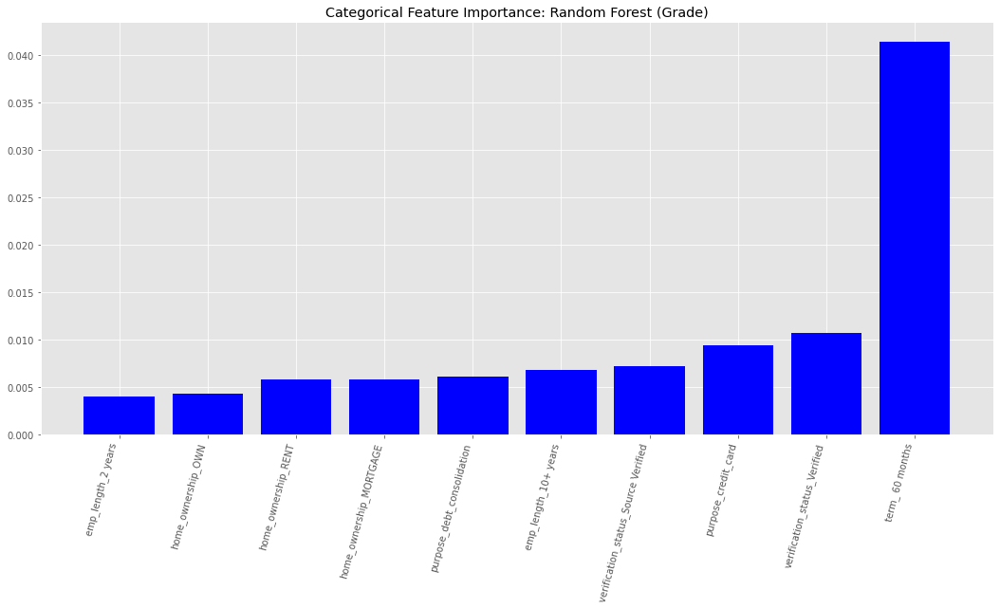

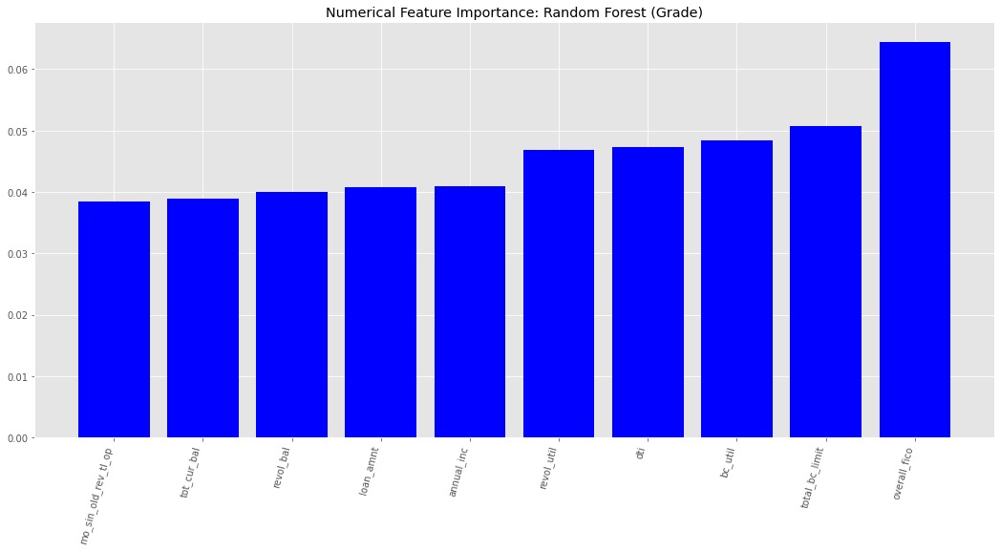

In [43]:
column_transformer = search_rfc_g.best_estimator_.named_steps['preprocessing']
cat_transformer = column_transformer.named_transformers_['cat']
onehot_columns=cat_transformer.get_feature_names(input_features=categorical_col_g)
features_list = list(onehot_columns)
features_list.extend(numeric_col_g)
feature_importances_coef = search_rfc_g.best_estimator_.named_steps['model'].feature_importances_
feature_importances = [feature_importance for feature_importance in zip(features_list, feature_importances_coef)]

cat_feature_importances = [(feature_name, feature_estimate) 
                           for feature_name, feature_estimate in feature_importances 
                      if any(category in feature_name for category in categorical_col)]

numerical_feature_importances = [(feature_name, feature_estimate) 
                           for feature_name, feature_estimate in feature_importances 
                      if not any(category in feature_name for category in categorical_col)]

plot_coefficients_only_positive(cat_feature_importances, 10, 'Categorical Feature Importance: Random Forest (Grade)')
plot_coefficients_only_positive(numerical_feature_importances, 10, 'Numerical Feature Importance: Random Forest (Grade)')

<h3>Feature Importance Analysis: Scaled Logistic Regression and `Good_Loan_Or_Not`</h3>

When predicting `loan grade` with Random Forest, overall you can see that there are several categorical features (with their different levels) and 4-5 numerical variables that have the highest "importance" as determined by the average gini impurity for each feature across all trees. It is important to note that the Blue values in this case just mean something is important. None of our features generated negative importance (hurting the model by including them). 


#### Categorical Feature importance 
As can be seen, with regards to predicting loan grade, the top 3 categorical treatments include the features `term`, `verification_status` and the `purpose_credit_card`.  

1. Term: 
This makes sense as loan grades are determined primarily to assist lenders when forecasting risk for a particular loan. This risk grade is meant to then be used to determine how high the interest rate must be for a lender to, on average, compensate for the heightened risk associated with a loan that is more likely to be `bad`. A loan with a longer term, (60 months) leaves more room for default or some financial crisis to occur for a lender.

2. Verification Status: 
Verification Status indicates whether or not a loaner has had their income verified. It makes logical sense that this impacts the grade, because if their income (which affects their ability to pay back the loan) has not been verified, then the lender is taking on more risk by not being absolutely sure that the loaner is capable of paying off their debt. 

3. Purpose Credit Card: 
The purpose of the loan also seems to have a high importance. This makes sense because if the purpose of the loan is to generate more income, that will directly positively impact the loaner's ability to pay back the loan more reliably. 


#### Numerical Feature importance 
As can be seen, with regards to predicting loan grade, the top 10 numerical treatments include the features `overall_fico`, `total_bc_limit` and `bc_util`.  

1. Overall FICO: 
Overall FICO represents the Average Fico Score between primary and secendary applicant if applicable. It makes sense that this score is used to determine grade because it represents the overall risk score that the loaner or loanee's have combined. 

2. Total bankcard high credit
This limit represents the overall credit limit for a given loaner. Similar to FICO score, the total credit allowed to a given loan recipient represents their overall borrowing power and encapsulates their debt, and ability to pay it off. As such, it is a risk indicator and it definitely makes sense that it is important for predicting RISK, which is an aggregate risk indicator for a given loan.

3. Bank Card Utilization: 
This represents the ratio of total current balance to high credit/credit limit for all bankcard accounts. Essentially this encapsulates, relative to the loaner's past loan/debt behavior, where do they currently stand financially with their debt for bank cards. This metric indicates a loaner's ability to pay back a loan, in their current state and it makes sense why it affects the aggregate risk indicator 'grade'. 

# Deployment
## Model One (loan outcome)  
Our first model predicts the variable good_loan_or_not.  Interested parties for this model include LendingClub itself and competitor peer-to-peer lending companies.  

### Interested Party: LendingClub  
LendingClub itself could use this model to identify current loans with higher odds of default. Because our model contains variables that are collected during the course of the loan (such as last_fico or last_pymnt_amnt), it could identify higher risk loans and allow LendingClub to take steps to intervene if necessary. The particular steps taken to intervene are outside the purview of this analysis, but they could include contact with the loan recipient, adjustment of payment amount, or extending hardship status proactively. If any of these steps lead to at least the partial recoup of loan payments that would have otherwise defaulted, the result would be an increased return for LendingClub. 

It is safe to assume that LendingClub uses its own algorithm to predict loan outcomes. Unfortunately, this model is not available to the public. If our model has more accurate predictions than the one they currently use, it could be used to identify high risk current loans. If our model has higher sensitivity and specificity than their current model, it would give the company more granularity when deciding on intervention measures. Comparison of the auc_roc values could be used to measure this improvement over a current model, with higher auc_roc indicating a better sensitivity and specificity. From a business standpoint, a decrease in the percentage of defaulted loans or an increase in the total received principal would measure the effectiveness of this model as an intervention measure. 

This model could be deployed by integrating it into LendingClub’s routine pipeline. When relevant updated information is collected (such as last_fico or last_pymnt_amnt), the model could give an updated assessment of default risk. Those loan recipients flagged at a certain risk level could be passed on to a representative for possible intervention measures. Additional data regarding the successful interventions and the characteristics of the loans associated with them would be useful to refine intervention methods. Updates to the model could be made as soon as this data became available. Additionally, general updates for models involving financial data should be conducted on a regular basis (potentially every year) or if there are any major changes to the financial market.  

### Interested Party: Competitors  
Competitor peer-to-peer lending companies could also find this model useful. Start-up companies in particular might use it as a starting point when building their own models. LendingClub is established and successful, and predictions from this model regarding loan outcomes could be used as a baseline for their own decisions and processes, such as which loans to accept and how to apply any possible intervention measures. Of course, the competitor would need to collect the same information as LendingClub to use the model, and there would be possible limitations. Loan applicants to a less established company might have different characteristics and outcomes than those studied in this model.

The model’s value could once again be measured as a comparison of auc_roc values, comparing our model with any proposed model the start-up is considering. If our model has higher auc_roc values, the better sensitivity and specificity would give more clarity regarding which investments to make and when to take intervention measures. The identification of high risk loans can then be used to for intervention and hopefully an increase in repayment amount and decrease in percentage of defaults.  

As for deployment, a new competitor would eventually customize their model. This model would be most useful as a starting point and benchmark for prediction accuracy. It could be deployed in the initial modeling and decision-making phase. Additional data about clients and loan outcomes would then be collected from the competitor’s clients to customize the model. As previously mentioned, we cannot assume the client population to be exactly the same, so the new loan outcome data could be used to update the model for the competitor. At least in the beginning stages, this model would need to be updated as soon as any loan outcome data became available.  

## Model Two (grade)  
Our second model predicts the variable grade.  An interested party for this model is individual prospective loan applicants and LendingClub.  

### Interested Party: Loan Applicants & LendingClub  
Prediction of grade could be utilized as a tool for loan applicants. The model could be provided through the LendingClub website, allowing prospective applicants to obtain an estimate of the interest rate range they will be offered. Because our model only uses a subset of the variables LendingClub collects, it could not provide the final grade; however, a quick estimate would be simple to obtain. This might attract more applicants, as submitting extensive personal information and waiting for a response is a potential barrier for some clients. Additionally, it could be set up in an interactive manner, where applicants could see how alterations to some of the fields could affect the grade estimate. This could encourage applicants to make financial decisions that set them up for successful loan repayment.

We could measure model value by tracking conversions for the tool use on the website. If the tool brings additional loan applicants, it will increase revenue. The additional data to be collected would be tracking conversions. We could also compare grade predictions to actual grade assignment for approved loans to further refine the grade model, examining precision and recall per grade class. An additional possibility is to collect and compare the data from those applicants who use the tool and those who do not, to see if there are any significant differences between the two groups and if the loan outcomes differ. The model itself would only need to be updated if changes were made to the grading process at LendingClub or if comparisons between predicted and actual grade indicated an area for suggested improvement.

# Exceptional Work

## Grid search, visualization and parameter analysis for each model
**During Model & Evaluation Part 4, in addition to analyzing the results using our chosen method of evaluation, we utilized grid search parameters in parallelized fashion and visualized the performance across attributes in both graphic and table format for each model**

### For Predicting `good_loans_or_not`
#### Scaled Logistic Regression
The winning parameter combination on the validation set utilized "lbfgs" as solver and C value at 100. We felt the C value, which stands for inverse of regularization strength, is a significant factor to tune in order to acquire the best Logistic Regression model.

#### Decision Tree
The winning parameter combination on the validation set utilized "splitter" of random, min_samples_split at number 80, and max_features using "None" instead of "auto". All these three parameters are important to balance the bias and variance of our decision tree classifier, but according to the parameter table, min_samples_split (the minimum number of samples required to split an internal node) is particularly important to quickly improve variance for the model on the validation set.

#### Random Forest
The winning parameter combination on the validation set utilized  "n_estimators" at 500 and "max_features" using auto. The validation results we tuned are fairly close to each other. However, in this case it seems "n_estimators" number of trees in the forest is particularly preferred - a larger forest. "max_features", which uses square root number of features being considered when looking for the best split, also had a slightly better performance compared to "log2" number of features.


### For Predicting `grade`
#### Scaled Logistic Regression
The winning parameter combination on the validation set utilized "ovr" (one versus rest) strategy comparing multiclass labels. "solver" used was "liblinear", and C value was 1. The validation scores are fairly close. However, it seems our 10 fold cross validation preferred the overall performance of this parameter combination. All the parameters mentioned are important in tuning the models. However, it seems "multinomial" strategy using either "saga" or "lbfgs" solver might not be statistically different from the "ovr" and "liblinear" by just looking at the validation scores.

#### Decision Tree
The winning parameter combination on the validation set utilized "splitter" of random, min_samples_split at number 80, and max_features using "None" instead of "auto". All these three parameters are important to balance the bias and variance of our decision tree classifier, but according to the parameter table, min_samples_split (the minimum number of samples required to split an internal node) is particularly important to quickly improve variance for the model on the validation set.

#### Random Forest
The winning parameter combination on the test set utilized  "n_estimators" at 500, and "max_features" using auto. The test results we tuned are fairly close to each other. However, in this case it seems "n_estimators" number of trees in the forest is particularly preferred - a larger forest. "max_features", which uses square root number of features being considered when looking for the best split, also had a slightly better performance compared to "log2" number of features.

**In addition to the grid search mentioned above, we attempted XGB for predicting grade and Neural Networks for predicting good_loan_or_not to see if we could further improve our predictions**

## XGB Model

In [6]:
%%time

# https://xgboost.readthedocs.io/en/latest/python/python_api.html#module-xgboost.sklearn
# according tot he documentation we should only have n_jobs on either the 


# Define preprocessing for columns
t_xgb_g = [('cat', OneHotEncoder(drop = reference_levels_to_drop_g), categorical_ix_g)]
col_transform_xgb_g = ColumnTransformer(t_xgb_g,remainder='passthrough')
model_xgb = xgb.XGBClassifier(use_label_encoder =True, objective="multi:softmax", eval_metric='mlogloss', random_state="123")
pipeline_xgb_g = Pipeline(steps=[('preprocessing',col_transform_xgb_g), ('model', model_xgb)])

search_space = [
    {
        'model__n_estimators': [2000],
        "model__learning_rate"    : [0.01, 0.1] ,
         "model__max_depth"        : [3, 5, 7],
         "model__gamma"            : [ 0.1, 0.4, 0.6],
        "model__n_jobs": [-1],
        "model__reg_lambda": [0, 0.1]
     }  
]

clf_xgb =  GridSearchCV(pipeline_xgb_g, search_space, cv=cv_xgb, scoring='roc_auc_ovr_weighted',
                                n_jobs=-1, verbose=verbose, return_train_score=True)

search_clf_xgb_g = clf_xgb.fit(X_train_g, y_train_g)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
CPU times: user 1h 17min 59s, sys: 28.5 s, total: 1h 18min 27s
Wall time: 17h 2min 3s


In [47]:
# TO DELETE
### MARK TO DELETE IN FINAL FILE
file_name_search_xgb_g = f"{cwd}/pickle_models/search_clf_xgb_g_model_V3.sav"
#joblib.dump(search_dtc, file_name_dtc)
search_xgb_g = joblib.load(file_name_search_xgb_g)

In [48]:
best_xgb_columns = ["mean_fit_time","param_model__reg_lambda", "param_model__gamma", "param_model__learning_rate", "param_model__max_depth", "param_model__n_estimators", "mean_train_score", "mean_test_score",  "rank_test_score"]

xgb_summary_g = add_text(cv_summary(search_xgb_g, best_xgb_columns),"xgb")
xgb_model_g = {
    "Mean CV Train":  xgb_summary_g[xgb_summary_g["rank_validation_score"]==1].mean_train_score.values[0]*100, 
    "Mean CV Validation": xgb_summary_g[xgb_summary_g["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc_per_class(search_xgb_g,  class_list, X_test_g,y_test_g)[0]["micro"]*100
}

## XGB Model Analysis


XGBoost models are ensemble models using decision trees as base learners. The Boosting technique sequentially trains base learners (tree models) one at a time,  and every new model is trained using the error knowledge from the previous model.   
<a href="https://towardsdatascience.com/a-beginners-guide-to-xgboost-87f5d4c30ed7">Source</a>

For this model, the best mean train/validation scores (train:77%, validation: 82%) come from hyperparameter combination #32. The XGB model has a test AUC slightly higher than the random forest (which was the best model for classifying grade). This one percent increase came at the cost of a longer training time. The XGB model took around 17 hours to train while the Random Forest model took 16 minutes. This represents a 5900% increase in training time. 


From looking at the "Mean CV Train/Validation Score" Plot it can be seen that the model mean train score has a high variance compared to the mean validation score. This suggests that the model will perform well on unseen data with almost every combination we tried on the grid search.  This differs from the Random Forest model which was overfitting the training data on every combination tried. 

Similar to all the other grade classification models, the XGB performs best at predicting grades A, B, and C, and poorly at D and E-G.  The reason for this is the two last classes are underrepresented, so it is difficult for a model to effectively learn to predict them. 



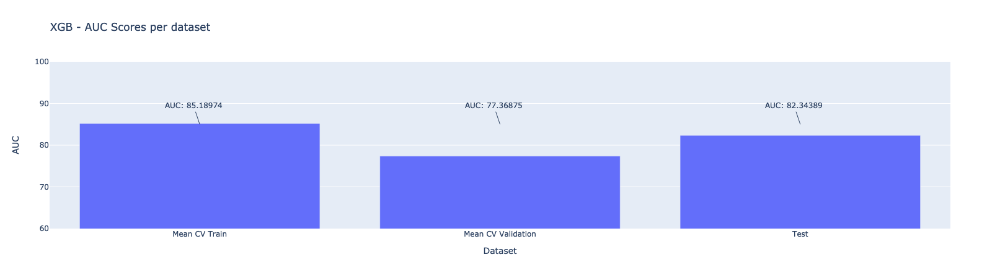

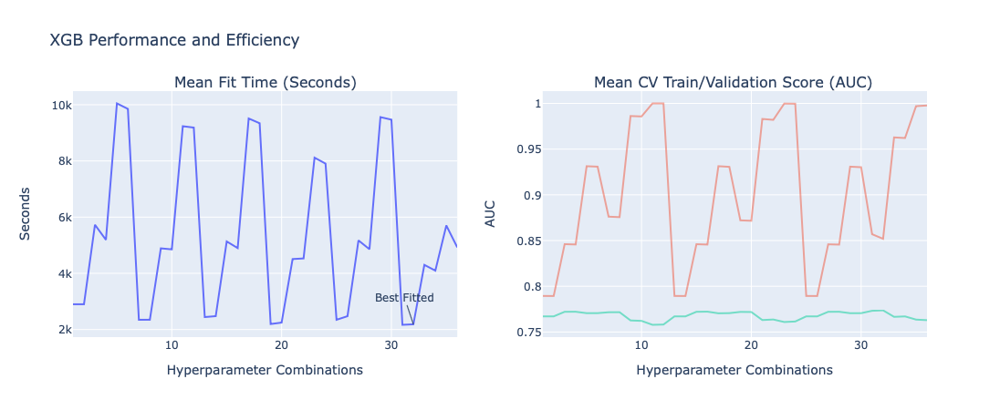

param_combination,mean_fit_time,param_model__reg_lambda,param_model__gamma,param_model__learning_rate,param_model__max_depth,param_model__n_estimators,mean_train_score,mean_validation_score,rank_validation_score
1,2899.157996,0,0.1,0.01,3,2000,0.789424,0.767085,21
2,2899.554288,0.1,0.1,0.01,3,2000,0.789354,0.767084,22
3,5727.384592,0,0.1,0.01,5,2000,0.846063,0.772104,6
4,5192.147914,0.1,0.1,0.01,5,2000,0.845726,0.772159,4
5,10047.418834,0,0.1,0.01,7,2000,0.931310,0.770600,15
6,9852.307748,0.1,0.1,0.01,7,2000,0.930820,0.770614,14
7,2346.623483,0,0.1,0.1,3,2000,0.876134,0.771603,12
8,2348.191957,0.1,0.1,0.1,3,2000,0.875630,0.771656,11
9,4889.456884,0,0.1,0.1,5,2000,0.986195,0.762637,31
10,4853.042258,0.1,0.1,0.1,5,2000,0.985741,0.762160,32


Train AUC: 0.84868
Test result:
              precision    recall  f1-score   support

           A       0.66      0.67      0.67      4730
           B       0.45      0.51      0.48      5845
           C       0.43      0.51      0.46      5499
           D       0.38      0.19      0.25      2781
         E-G       0.47      0.27      0.34      1145

    accuracy                           0.49     20000
   macro avg       0.48      0.43      0.44     20000
weighted avg       0.49      0.49      0.48     20000



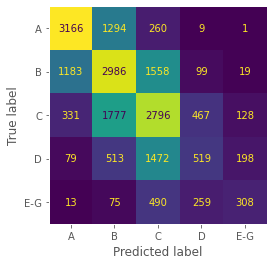

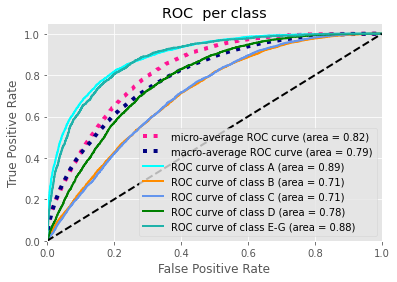

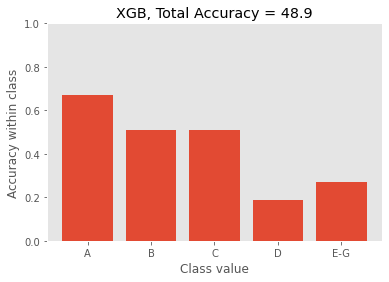

In [49]:
y_hat_xgb_g = search_xgb_g.predict(X_test_g)
make_bar_plot_per_model(xgb_model_g, "XGB - AUC Scores per dataset")
plot(xgb_summary_g, "XGB")
get_classification_report_multi_response(X_train_g, y_train_g, X_test_g, y_test_g, y_hat_xgb_g, search_xgb_g)
plot_class_acc(y_test_g, y_hat_xgb_g, title="XGB")

## Deep Neural Network: Precting `Good_Loan_Or_Not`

In [44]:
# imports
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras import Sequential
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.optimizers import Adam
import types
import tempfile

In [118]:
#  Subsampling Helper functions
def load_data_nn(path, sample=0):
    if sample>0:
        data = pd.read_pickle(path).reset_index().sample(sample, random_state=10)
    elif sample == 0:
        data = pd.read_pickle(path).reset_index()
    data.drop('index',axis=1,inplace=True)
    return data

def get_final_dataset(path, sample, drop_vars, response):
    data = load_data_nn(path, sample)
    data = create_variables_data(data);
    data = drop_variables(data, drop_vars)
    # choose x and y
    X, y = prepare_x_y(data, response)
    # train test split 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=101, stratify=y)
    categorical_col, numeric_col, categorical_ix, numeric_ix = get_indexes(X)
    
    return X_train, X_test, y_train, y_test, categorical_col, numeric_col, categorical_ix, numeric_ix


def get_classification_report_nn(x_train, y_train, x_test, y_test, pred, model):
    """
    This function is used to get comprehensive classification report:
    Training Accuracy, Test Accuracy, print classification_report
    plot confusion matrix, and plot roc curve.
    """
    print(f"Train AUC: {get_acc_score(model, x_train, y_train):,.5f}") #Since model is score in AUC, .score now calculates AUC
    print("Test result:")
    print(classification_report(y_test,pred))
    plot_roc_curve_custom(y_test, pred)
    plt.grid(None)
#     plot_roc_curve(model, x_test,y_test, response_method="predict_proba")
    fpr, tpr, thresholds = roc_curve(y_test, pred, pos_label=1)
    print(f"Test AUC: {auc(fpr, tpr):,.5f}")


In [46]:
# Keras Model function
def create_model_nn(init_mode='uniform', 
                 learning_rate=0.1,
                 dropout=0.1,
                hidden_layer_width = 20):
    model = Sequential()
    model.add(Dense(hidden_layer_width, kernel_initializer=init_mode, activation='selu'))
    model.add(Dropout(dropout))
    model.add(Dense(hidden_layer_width, kernel_initializer=init_mode, activation='selu'))
    model.add(Dropout(dropout))
    model.add(Dense(1, kernel_initializer=init_mode, activation='sigmoid'))
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='binary_crossentropy',optimizer=optimizer,
    metrics=['accuracy'])
    return model     

In [106]:
# Keras Hyperparameters & Grid
nn_sample = 30000
nn_epochs = 100

# Use a small grid for now. 
nn_grid = [
    {
        'model__init_mode': ['normal'],
        'model__dropout': [0.2, 0.3],
        'model__learning_rate': [0.001],
        'model__hidden_layer_width': [4, 5]
     }
]

In [107]:
#Subsample for training efficiency 
#Todo: update path to use path variable 
X_train_nn, X_test_nn, y_train_nn, y_test_nn, categorical_col_nn, numeric_col_nn, categorical_ix_nn, numeric_ix_nn = get_final_dataset(path, nn_sample, drop_vars, "good_loan_or_not")

model = KerasClassifier(build_fn=create_model_nn, epochs=nn_epochs, batch_size=10, verbose=0)


# pipeline
t_nn = [('cat', OneHotEncoder(), categorical_ix_nn),
         ('scale',StandardScaler(), numeric_ix_nn)]
col_transform_nn = ColumnTransformer(t_nn)


pipeline_nn_scaled = Pipeline(steps=[('preprocessing',col_transform_nn), 
                                     ('model', model)])


clf_nn = GridSearchCV(estimator=pipeline_nn_scaled, param_grid=nn_grid, 
                            scoring='roc_auc',# average='macro'), 
                            n_jobs=-1, cv=cv, verbose=verbose, 
                            return_train_score=True)

search_clf_nn = clf_nn.fit(X_train_nn, y_train_nn)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


In [114]:
nn_summary

,param_combination,mean_fit_time,param_model__init_mode,param_model__dropout,param_model__learning_rate,param_model__hidden_layer_width,mean_train_score,mean_validation_score,rank_validation_score
0,1,542.467361,normal,0.2,0.001,4,0.974225,0.971436,2
1,2,553.542399,normal,0.2,0.001,5,0.975116,0.971552,1
2,3,578.703353,normal,0.3,0.001,4,0.973447,0.971342,3
3,4,412.430929,normal,0.3,0.001,5,0.973879,0.971260,4


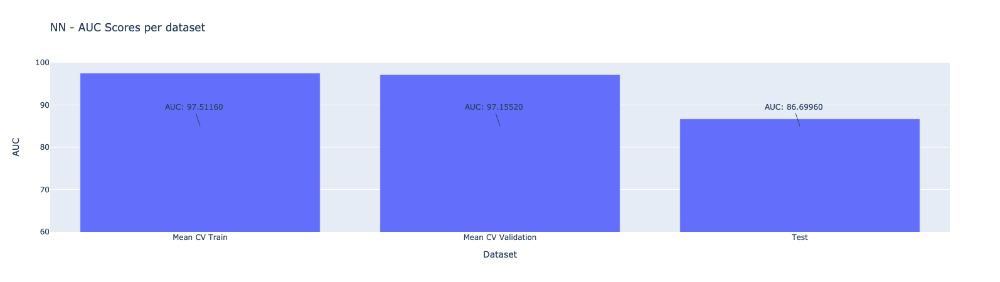

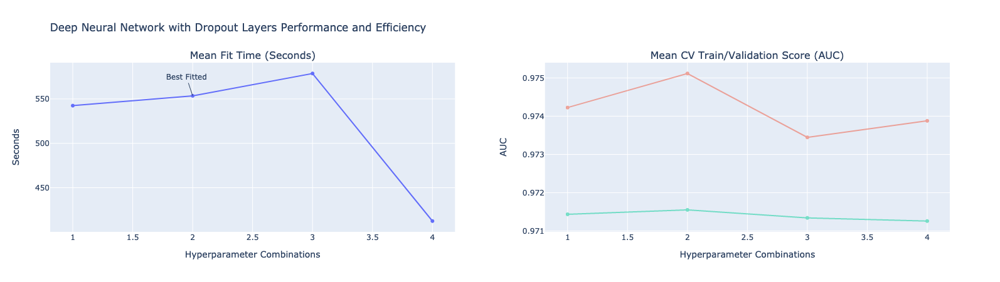

param_combination,mean_fit_time,param_model__init_mode,param_model__dropout,param_model__learning_rate,param_model__hidden_layer_width,mean_train_score,mean_validation_score,rank_validation_score
1,542.467361,normal,0.2,0.001,4,0.974225,0.971436,2
2,553.542399,normal,0.2,0.001,5,0.975116,0.971552,1
3,578.703353,normal,0.3,0.001,4,0.973447,0.971342,3
4,412.430929,normal,0.3,0.001,5,0.973879,0.971260,4


Train AUC: 0.97469
Test result:
              precision    recall  f1-score   support

           0       0.81      0.76      0.78       731
           1       0.97      0.97      0.97      5269

    accuracy                           0.95      6000
   macro avg       0.89      0.87      0.88      6000
weighted avg       0.95      0.95      0.95      6000

Test AUC: 0.86700


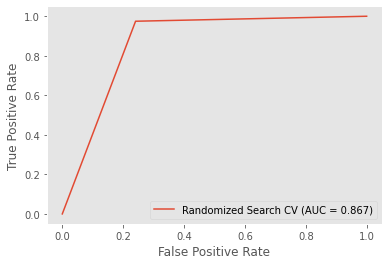

In [119]:
y_hat_nn = search_clf_nn.predict(X_test_nn)
best_nn_columns = ["mean_fit_time","param_model__init_mode", "param_model__dropout", "param_model__learning_rate", "param_model__hidden_layer_width", "mean_train_score", "mean_test_score", "rank_test_score"]

nn_summary = add_text(cv_summary(search_clf_nn, best_nn_columns),"nn")
nn_model = {
    "Mean CV Train":  nn_summary[nn_summary["rank_validation_score"]==1].mean_train_score.values[0]*100, 
    "Mean CV Validation": nn_summary[nn_summary["rank_validation_score"]==1].mean_validation_score.values[0]*100,
    "Test": get_auc(y_test_nn, y_hat_nn)*100
}

make_bar_plot_per_model(nn_model, "NN - AUC Scores per dataset")
plot(nn_summary, "Deep Neural Network with Dropout Layers")
get_classification_report_nn(X_train_nn, y_train_nn, X_test_nn, y_test_nn, y_hat_nn, search_clf_nn)

## Deep Neural Network with Dropout Layers: Model Analysis

Neural Network models generally use stochastic gradient descent or some other optimizer along with back-propogation to update weights for both hidden, input, and output layers. In this case we implemented a variable width Deep Neural Network with 2 hidden layers, and dropout layers in front of all hidden layers. The dropout layers use a technique analogous to Random forest to randomly drop nodes out of layers to encourage the model to not overtrain a particular node or input. We used the Selu Activation function to avoid the vanishing gradient problem and randomized and normalized weights to avoid the exploding gradient problem. 

<a href="https://towardsdatascience.com/a-beginners-guide-to-xgboost-87f5d4c30ed7">Source</a>


As can be seen above, our deep neural network, trained with 2 hidden layers, 2 dropout layers, and with selu activation functions performed with about 0.87 Test ROC AUC, and 0.97 Train and Validation ROC AUC. This hints at the fact that the neural network is overfitting for prediction of `good_loan_or_not` even though we implemented dropout layers to mitigate overfitting. 

Training time was also very slow per fold at 550 seconds. This was also for a subsampled dataset with only 30,000 samples and 100 epochs. This might have been improved by implementing GPU acceleration with CUDA or some other package. 

#### Bonus section: Saving the Keras NN 

Saving a Keras Model with GridSearchCV is different and took some time to figue out. As such, we have included an example of doing so here. 

How does this work:

- First you save the Keras model (extracted from the pipeline) as an .h5 file
- Convert the "model" step of the pipeline to None
- Pickle the pipeline (that only contains preprocessing, no model)

For Load in Saved Keras NN:
- Load the pickle pipeline 
- Load the model (using Keras API) as the "model" step of the pipeline

Resources: https://stackoverflow.com/questions/37984304/how-to-save-a-scikit-learn-pipline-with-keras-regressor-inside-to-disk

In [121]:
from keras.models import load_model
# save model
file_name_keras_nn = f"{cwd}/pickle_models/keras_nn_v1.h5"
search_clf_nn.best_estimator_.named_steps["model"].model.save(file_name_keras_nn)

# save pipeline
file_name_keras_nn_pipeline = f"{cwd}/pickle_models/keras_nn_v1_pipeline.sav"
search_clf_nn.best_estimator_.named_steps["model"].model = None
joblib.dump(search_clf_nn.best_estimator_, file_name_keras_nn_pipeline)


## load
# # load pipeline
# nn_pipeline = joblib.load(file_name_keras_nn_pipeline)

# # load model
# nn_pipeline.named_steps['model'].model = load_model(file_name_keras_nn)

['/Users/riccoferraro/Documents/SMU/ML1/MachineLearningOne/pickle_models/keras_nn_v1_pipeline.sav']